## some nvidia gpu info

In [ ]:
!nvidia-smi
!free
!df -h

Tue Sep 30 09:41:40 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.65.06              Driver Version: 580.65.06      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   40C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

### Dependencies

In [ ]:
!pip install git+https://github.com/lucidrains/denoising-diffusion-pytorch.git --upgrade
!pip install -q torchvision wandb

  Cloning https://github.com/lucidrains/denoising-diffusion-pytorch.git to /tmp/pip-req-build-no8ypod4
  Running command git clone --filter=blob:none --quiet https://github.com/lucidrains/denoising-diffusion-pytorch.git /tmp/pip-req-build-no8ypod4
  Resolved https://github.com/lucidrains/denoising-diffusion-pytorch.git to commit 8fac8e52126f5d8dbf93c4a8c3af4e9924000369
  Preparing metadata (setup.py) ... done


## Imports

In [3]:
import glob
import os
import re
from torchvision import datasets
from torch.utils.data import DataLoader, random_split
import torch.nn.functional as F
import torch
import torchvision
import torchvision.transforms as T
from torch.utils.data import DataLoader,Subset
from torchvision.utils import make_grid
from tqdm import tqdm
import wandb
import sys
from denoising_diffusion_pytorch import Unet, GaussianDiffusion
import torch.nn as nn
import numpy as np
from torch.utils.data import TensorDataset
from torch.utils.data import Subset
from collections import defaultdict
from torch.utils.data import ConcatDataset
import matplotlib.pyplot as plt
from pytorch_fid.fid_score import calculate_frechet_distance
from PIL import Image

import time
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## mount drive

In [3]:
#from google.colab import drive
#drive.mount('/content/drive', force_remount=True)

## arranging the checkpoints directory

In [4]:
#CHECKPOINT_DIR = "/content/drive/MyDrive/_ddpm_mnist_checkpoints"
CHECKPOINT_DIR = "ddpm_mnist_checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

def extract_epoch_number(filename):
    match = re.search(r"epoch(\d+)", filename)
    return int(match.group(1)) if match else -1

# --- BEFORE ---
print('==== BEFORE ====')
checkpoint_paths = glob.glob(os.path.join(CHECKPOINT_DIR, "*.pt"))
start_epoch = 0
for f in sorted(checkpoint_paths, key=extract_epoch_number, reverse=True):
    epoch = extract_epoch_number(f)
    if epoch >= start_epoch:
        print(f)

# --- DELETE ---
start_epoch = 36  # Change CAREFULLY as needed (CHECKPOINTS OF LARGER EPOCH WILL BE DELETED)
for f in checkpoint_paths:
    epoch = extract_epoch_number(f)
    if epoch >= start_epoch:
        os.remove(f)

# --- AFTER ---
print('==== AFTER ====')
checkpoint_paths = glob.glob(os.path.join(CHECKPOINT_DIR, "*.pt"))
start_epoch = 0
for f in sorted(checkpoint_paths, key=extract_epoch_number, reverse=True):
    epoch = extract_epoch_number(f)
    if epoch >= start_epoch:
        print(f)


==== BEFORE ====
ddpm_mnist_checkpoints/ddpm_epoch035.pt
ddpm_mnist_checkpoints/ddpm_epoch034.pt
ddpm_mnist_checkpoints/ddpm_epoch033.pt
ddpm_mnist_checkpoints/ddpm_epoch032.pt
ddpm_mnist_checkpoints/ddpm_epoch031.pt
ddpm_mnist_checkpoints/ddpm_epoch030.pt
ddpm_mnist_checkpoints/ddpm_epoch029.pt
ddpm_mnist_checkpoints/ddpm_epoch028.pt
ddpm_mnist_checkpoints/ddpm_epoch027.pt
ddpm_mnist_checkpoints/ddpm_epoch026.pt
ddpm_mnist_checkpoints/ddpm_epoch025.pt
ddpm_mnist_checkpoints/ddpm_epoch024.pt
ddpm_mnist_checkpoints/ddpm_epoch023.pt
ddpm_mnist_checkpoints/ddpm_epoch022.pt
ddpm_mnist_checkpoints/ddpm_epoch021.pt
ddpm_mnist_checkpoints/ddpm_epoch020.pt
ddpm_mnist_checkpoints/ddpm_epoch019.pt
ddpm_mnist_checkpoints/ddpm_epoch018.pt
ddpm_mnist_checkpoints/ddpm_epoch017.pt
ddpm_mnist_checkpoints/ddpm_epoch016.pt
ddpm_mnist_checkpoints/ddpm_epoch015.pt
ddpm_mnist_checkpoints/ddpm_epoch014.pt
ddpm_mnist_checkpoints/ddpm_epoch013.pt
ddpm_mnist_checkpoints/ddpm_epoch012.pt
ddpm_mnist_checkpoints/

## dataset splits and their loaders

In [5]:
torch.manual_seed(42)  # ensure reproducibility across runs

# --- Config
BATCH_SIZE = 128
IMAGE_SIZE = 28
TIMESTEPS = 1000
SAMPLING_TIMESTEPS = 50

# --- Transform
transform = T.Compose([
    T.Resize(IMAGE_SIZE),
    T.ToTensor(),
    lambda x: x * 2 - 1
])

# --- Full original training set (60K)
full_train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)

# --- Deterministic split into train/val
VAL_SIZE = 5000
TRAIN_SIZE = len(full_train_dataset) - VAL_SIZE
train_dataset, val_dataset = random_split(full_train_dataset, [TRAIN_SIZE, VAL_SIZE])

# --- True test set (untouched)
test_dataset = datasets.MNIST(root='./data', train=False, download=True, transform=transform)

# --- DataLoaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False)


## Model

In [6]:
def build_model_and_diffusion(device, image_size=IMAGE_SIZE):
    model = Unet(
        dim=64,
        dim_mults=(1, 2, 4), #64 → 128 → 256
        channels=1
    ).to(device)

    diffusion = GaussianDiffusion(
        model,
        image_size=image_size,
        timesteps=TIMESTEPS,                      # training schedule (typically 1000)
        sampling_timesteps=SAMPLING_TIMESTEPS     # number of DDIM steps at inference time (typicall 50)
    ).to(device)

    return model, diffusion


## loss computations

In [ ]:
def compute_loss(model, diffusion, x0, device):
    b = x0.size(0)
    T_full = diffusion.num_timesteps

    # Quadratic timestep sampling
    u = torch.rand(b, device=device)
    t = (u ** 2 * T_full).long().clamp(0, T_full - 1).view(-1)

    # Forward noising
    noise = torch.randn_like(x0)
    x_t = diffusion.q_sample(x_start=x0, t=t, noise=noise)

    # Noise prediction
    pred_noise = model(x_t, t)

    # Loss
    return F.mse_loss(pred_noise, noise)


def compute_val_loss(model, diffusion, val_loader, device, max_batches=None):
    model.eval()
    total_loss = 0.0
    count = 0
    with torch.no_grad():
        for i, (x, _) in enumerate(val_loader):
            if max_batches is not None and i >= max_batches:
                break
            x = x.to(device)
            loss = compute_loss(model, diffusion, x, device)
            total_loss += loss.item()
            count += 1
    return total_loss / count if count > 0 else float("nan")


In [ ]:
def compute_loss(model, diffusion, x0, device):
    b = x0.size(0)
    T_full = diffusion.num_timesteps

    # Quadratic timestep sampling
    u = torch.rand(b, device=device)
    t = (u ** 2 * T_full).long().clamp(0, T_full - 1).view(-1)

    # Forward noising
    noise = torch.randn_like(x0)
    x_t = diffusion.q_sample(x_start=x0, t=t, noise=noise)

    # Noise prediction
    pred_noise = model(x_t, t)

    # Loss
    return F.mse_loss(pred_noise, noise)


def compute_val_loss(model, diffusion, val_loader, device, max_batches=None):
    model.eval()
    total_loss = 0.0
    count = 0
    with torch.no_grad():
        for i, (x, _) in enumerate(val_loader):
            if max_batches is not None and i >= max_batches:
                break
            x = x.to(device)
            loss = compute_loss(model, diffusion, x, device)
            total_loss += loss.item()
            count += 1
    return total_loss / count if count > 0 else float("nan")


## single step reconstruction

In [ ]:
import torch.nn.functional as F

def compute_psnr(x_recon, x_gt):
    """
    Compute PSNR per image in a batch, assuming input images in [-1, 1].
    """
    mse = F.mse_loss(x_recon, x_gt, reduction='none').mean(dim=(1, 2, 3))
    psnr = -10 * torch.log10(mse + 1e-8)
    return psnr

def visualize_reconstructions(model, diffusion, fixed_images, fixed_noise, device, epoch, prefix="train"):
    model.eval()
    with torch.no_grad():
        timesteps_to_eval = [50, 100, 900]  # Change as needed
        b = fixed_images.shape[0]

        psnr_results = []
        recon_grids = []
        noise_mse_results = []

        for t_val in timesteps_to_eval:
            t = torch.full((b,), t_val, device=device, dtype=torch.long)
            x_noisy = diffusion.q_sample(fixed_images, t=t, noise=fixed_noise)

            # Predict noise
            pred_noise = model(x_noisy, t)

            x_recon = diffusion.predict_start_from_noise(x_noisy, t, pred_noise).clamp(-1, 1)
            x_noisy_min = x_noisy.amin(dim=(1, 2, 3), keepdim=True)
            x_noisy_max = x_noisy.amax(dim=(1, 2, 3), keepdim=True)
            x_noisy_norm = 2 * (x_noisy - x_noisy_min) / (x_noisy_max - x_noisy_min + 1e-8) - 1

            # Compute PSNR
            psnr = compute_psnr(x_recon, fixed_images)
            psnr_mean = psnr.mean().item()
            psnr_results.append((t_val, psnr_mean))

            # Compute noise MSE
            noise_mse = F.mse_loss(pred_noise, fixed_noise, reduction='none').mean(dim=(1, 2, 3))
            noise_mse_results.append((t_val, noise_mse.mean().item()))

            combined = torch.cat([fixed_images, x_noisy_norm, x_recon], dim=0)
            combined = (combined + 1) / 2.0  # ← this rescales to [0, 1]
            grid = make_grid(combined, nrow=b, pad_value=1)

            # ✅ Append the grid so it gets logged
            recon_grids.append((t_val, psnr_mean, grid.cpu()))

        # Log scalar metrics
        for t_val, psnr_val in psnr_results:
            wandb.log({f"{prefix}/psnr_t{t_val}": psnr_val}, step=epoch)
        for t_val, noise_mse_val in noise_mse_results:
            wandb.log({f"{prefix}/noise_mse_t{t_val}": noise_mse_val}, step=epoch)

        # Log image grids with PSNR in the caption
        for t_val, psnr_val, grid in recon_grids:
            wandb.log({
                f"{prefix}/recon_grid_t{t_val}": wandb.Image(
                    grid,
                    caption=f"t={t_val} | PSNR={psnr_val:.2f}dB\nTop: GT | Middle: xₜ | Bottom: x̂₀"
                )
            }, step=epoch)


## training script

In [ ]:
# --- Config
EPOCHS = 35
SAVE_EVERY = 1
NUM_RECONS = 20

max_batches = None  # set to int for quick debug

# --- Init wandb
wandb.init(project="ddpm-mnist-train", config={
    "epochs": EPOCHS,
    "batch_size": BATCH_SIZE,
    "image_size": IMAGE_SIZE
})
wandb.define_metric("epoch")
wandb.define_metric("train_loss", step_metric="epoch")
wandb.define_metric("val_loss", step_metric="epoch")
wandb.define_metric("recon_psnr", step_metric="epoch")


# --- Device setup
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Training on", device)

# --- Fixed validation images, noise, and timesteps
fixed_loader = DataLoader(val_dataset, batch_size=NUM_RECONS, shuffle=False)
fixed_images, _ = next(iter(fixed_loader))
fixed_images = fixed_images.to(device)

fixed_noise = torch.randn_like(fixed_images)
norms = fixed_noise.view(NUM_RECONS, -1).norm(dim=1)
sorted_idx = norms.argsort()
fixed_noise = fixed_noise[sorted_idx]
fixed_images = fixed_images[sorted_idx]

# --- Model & Diffusion
model, diffusion = build_model_and_diffusion(device=device, image_size=IMAGE_SIZE)

# --- Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4)

# --- Resume from checkpoint if available
latest_ckpt = None
for f in sorted(os.listdir(CHECKPOINT_DIR), reverse=True):
    print('f:',f)
    if f.endswith(".pt"):
        latest_ckpt = os.path.join(CHECKPOINT_DIR, f)
        break

# start_epoch = 1
# if latest_ckpt:
#     print("Resuming from", latest_ckpt)
#     ckpt = torch.load(latest_ckpt, map_location=device)
#     model.load_state_dict(ckpt["model"])
#     start_epoch = ckpt["epoch"] + 1
start_epoch = 1

# --- Training loop
for epoch in range(start_epoch, EPOCHS + 1):
    ckpt_name = f"ddpm_epoch{epoch:03d}.pt"
    ckpt_path = os.path.join(CHECKPOINT_DIR, ckpt_name)

    if os.path.exists(ckpt_path):
        print(f"🔁 Skipping training for epoch {epoch} — loading checkpoint.")
        ckpt = torch.load(ckpt_path, map_location=device)
        model.load_state_dict(ckpt["model"])
    else:
        model.train()
        pbar = tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS}")
        total_loss = 0

        for i, (x, _) in enumerate(pbar):
            if max_batches is not None and i >= max_batches:
                break
            # loss
            x0 = x.to(device)
            loss = compute_loss(model, diffusion, x0, device)
            loss.backward()
            # optimization
            optimizer.step()
            optimizer.zero_grad()

            total_loss += loss.item()
            pbar.set_postfix(loss=loss.item())

        avg_loss = total_loss / len(train_loader)
        wandb.log({"epoch": epoch, "train_loss": avg_loss}, step=epoch)
        print(f"Epoch {epoch}: avg loss = {avg_loss:.4f}")

        # Save checkpoint
        if epoch % SAVE_EVERY == 0:
            torch.save({"epoch": epoch, "model": model.state_dict()}, ckpt_path)
            print("Checkpoint saved:", ckpt_path)


    # Sampling
    if epoch % SAVE_EVERY == 0:
        model.eval()
        with torch.no_grad():

            # --- Get real validation images (first 100) ---
            real_images = next(iter(val_loader))[0][:100].to(device)  # (B, C, H, W)
            real_images_flat = real_images.flatten().cpu().numpy()

            # --- Sample from DDIM with 50 and 100 steps ---
            sampled_ddim_50 = diffusion.ddim_sample((100, 1, 28, 28))

            sampled_binary = (sampled_ddim_50 > 0.6).float() # threshold choice was arbitrary (0.77 gives GT statistics)

            # --- Extract numpy arrays for histogram ---
            ddim50 = sampled_ddim_50.flatten().cpu().numpy()
            binary = sampled_binary.flatten().cpu().numpy()

            # --- Create image grids ---
            from torchvision.utils import make_grid

            grid_real = make_grid((real_images * 255).round().to(torch.uint8), nrow=10, pad_value=255)
            grid_50 = make_grid((sampled_ddim_50 * 255).round().to(torch.uint8), nrow=10, pad_value=255)
            grid_binary = make_grid((sampled_binary * 255).round().to(torch.uint8), nrow=10, pad_value=255)

            # --- Log everything to WandB ---
            wandb.log({
                "real_images": wandb.Image(grid_real, caption=f"Real Validation Images (Epoch {epoch})"),
                "samples_ddim_50": wandb.Image(grid_50, caption=f"DDIM Samples (50 Steps, Epoch {epoch})"),
                "samples_binary": wandb.Image(grid_binary, caption=f"DDIM Binary Thresholded (100 Steps, Epoch {epoch})"),
            }, step=epoch)


    # Reconstructions
    if epoch % SAVE_EVERY == 0:
        visualize_reconstructions(model, diffusion, fixed_images, fixed_noise, device, epoch, prefix="train")
        # --- Validation loss ---
        val_loss = compute_val_loss(model, diffusion, val_loader, device)
        wandb.log({"epoch": epoch, "val_loss": val_loss}, step=epoch)
        print(f"✅ Epoch {epoch}: val loss = {val_loss:.4f}")


epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
train/noise_mse_t100,█▅▄▃▃▃▂▂▂▂▂▂▂▂▁▁▂▁▁▁▁▁▁▂▁▁▁▂▂▁▁▁▁▁▁
train/noise_mse_t50,█▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▂▁▁▂▁▁▁▂▁▁▁▂▁▁▁▁▁▁▁
train/noise_mse_t900,█▆▃▃▂▃▂▂▂▁▂▂▁▁▁▁▁▂▂▁▁▂▁▁▁▁▁▁▁▁▁▂▂▁▂
train/psnr_t100,▁▃▅▅▅▆▆▆▆▇▇▇▇▇▇█▇█▇▇▇██▇▇▇█▇▇██▇███
train/psnr_t50,▁▄▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇██▇███
train/psnr_t900,▁▅▆▅▇▅▇▇▇█▇▅▇▇█▇█▇▇█████▇▇███▇▇▇▇█▇
val_loss,█▄▄▃▂▂▂▂▂▂▂▂▂▂▂▁▁▂▁▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁
epoch,35
train/noise_mse_t100,0.07286
train/noise_mse_t50,0.08703


Training on cuda
f: gen_images.pt
🔁 Skipping training for epoch 1 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 1: val loss = 0.1038
🔁 Skipping training for epoch 2 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 2: val loss = 0.0797
🔁 Skipping training for epoch 3 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 3: val loss = 0.0753
🔁 Skipping training for epoch 4 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 4: val loss = 0.0704
🔁 Skipping training for epoch 5 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 5: val loss = 0.0662
🔁 Skipping training for epoch 6 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 6: val loss = 0.0658
🔁 Skipping training for epoch 7 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 7: val loss = 0.0648
🔁 Skipping training for epoch 8 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 8: val loss = 0.0646
🔁 Skipping training for epoch 9 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 9: val loss = 0.0630
🔁 Skipping training for epoch 10 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 10: val loss = 0.0628
🔁 Skipping training for epoch 11 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 11: val loss = 0.0614
🔁 Skipping training for epoch 12 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 12: val loss = 0.0608
🔁 Skipping training for epoch 13 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 13: val loss = 0.0599
🔁 Skipping training for epoch 14 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 14: val loss = 0.0619
🔁 Skipping training for epoch 15 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 15: val loss = 0.0606
🔁 Skipping training for epoch 16 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 16: val loss = 0.0593
🔁 Skipping training for epoch 17 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 17: val loss = 0.0595
🔁 Skipping training for epoch 18 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 18: val loss = 0.0618
🔁 Skipping training for epoch 19 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 19: val loss = 0.0586
🔁 Skipping training for epoch 20 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 20: val loss = 0.0612
🔁 Skipping training for epoch 21 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 21: val loss = 0.0592
🔁 Skipping training for epoch 22 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 22: val loss = 0.0584
🔁 Skipping training for epoch 23 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 23: val loss = 0.0595
🔁 Skipping training for epoch 24 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 24: val loss = 0.0612
🔁 Skipping training for epoch 25 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 25: val loss = 0.0582
🔁 Skipping training for epoch 26 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 26: val loss = 0.0579
🔁 Skipping training for epoch 27 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 27: val loss = 0.0586
🔁 Skipping training for epoch 28 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 28: val loss = 0.0595
🔁 Skipping training for epoch 29 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 29: val loss = 0.0593
🔁 Skipping training for epoch 30 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 30: val loss = 0.0581
🔁 Skipping training for epoch 31 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 31: val loss = 0.0562
🔁 Skipping training for epoch 32 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 32: val loss = 0.0566
🔁 Skipping training for epoch 33 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 33: val loss = 0.0583
🔁 Skipping training for epoch 34 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 34: val loss = 0.0573
🔁 Skipping training for epoch 35 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 35: val loss = 0.0577


# Passive Phase

## Feature-extraction network to convert image-space to feature-space

In [7]:
class SimpleMNISTFeatureNet(nn.Module):

    def __init__(self):
        super().__init__()
        self.conv = nn.Sequential(
        nn.Conv2d(1, 32, 3, 1), nn.ReLU(), nn.MaxPool2d(2),
        nn.Conv2d(32, 64, 3, 1), nn.ReLU(), nn.MaxPool2d(2)
        )
        self.flatten = nn.Flatten()
        self.fc_feat = nn.Linear(64 * 5 * 5, 128)
        self.fc_out = nn.Linear(128, 10)

    def forward(self, x):
        x = self.conv(x)
        x = self.flatten(x)
        feat = F.relu(self.fc_feat(x))
        out = self.fc_out(feat)
        return out, feat # classification output and feature vector


In [ ]:
SEED = 42
BATCH_SIZE = 128
EPOCHS_CNN = 8           # 5–10 epochs is usually enough for ≥98–99% on MNIST
LR = 1e-3
IMAGE_SIZE = 28
CKPT_PATH = "mnist_feature_extractor.pt"
NUM_WORKERS = 2
PIN_MEMORY = True

torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


def evaluate(model, loader, device):
    model.eval()
    correct = 0
    total = 0
    loss_sum = 0.0
    with torch.no_grad():
        for x, y in loader:
            x = x.to(device, non_blocking=True)
            y = y.to(device, non_blocking=True)
            logits, _ = model(x)
            loss = F.cross_entropy(logits, y, reduction="sum")
            loss_sum += loss.item()
            pred = logits.argmax(dim=1)
            correct += (pred == y).sum().item()
            total += y.numel()
    return loss_sum / total, correct / total

### Train:

In [ ]:
def train_cnn():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print("Training feature extractor on:", device)

    model = SimpleMNISTFeatureNet().to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=LR)

    best_val_acc = 0.0

    for epoch in range(1, EPOCHS_CNN + 1):
        model.train()
        running_loss = 0.0
        running_count = 0

        for x, y in train_loader:
            x = x.to(device, non_blocking=True)
            y = y.to(device, non_blocking=True)

            optimizer.zero_grad(set_to_none=True)
            logits, _ = model(x)
            loss = F.cross_entropy(logits, y)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * y.size(0)
            running_count += y.size(0)

        train_loss = running_loss / max(1, running_count)
        val_loss, val_acc = evaluate(model, val_loader, device)

        print(f"Epoch {epoch:02d}/{EPOCHS_CNN} | train_loss: {train_loss:.4f} | "
              f"val_loss: {val_loss:.4f} | val_acc: {val_acc*100:.2f}%")

        # Save best checkpoint by validation accuracy
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            torch.save({"model": model.state_dict(),
                        "val_acc": best_val_acc,
                        "epoch": epoch}, CKPT_PATH)
            print(f"Saved best ckpt to {CKPT_PATH} (val_acc={best_val_acc*100:.2f}%)")

    print("Done. Best val_acc:", f"{best_val_acc*100:.2f}%")
    return model

In [ ]:
cnn_mnist = train_cnn()

Training feature extractor on: cuda
Epoch 01/8 | train_loss: 0.2169 | val_loss: 0.0794 | val_acc: 97.60%
Saved best ckpt to mnist_feature_extractor.pt (val_acc=97.60%)
Epoch 02/8 | train_loss: 0.0570 | val_loss: 0.0654 | val_acc: 98.24%
Saved best ckpt to mnist_feature_extractor.pt (val_acc=98.24%)
Epoch 03/8 | train_loss: 0.0382 | val_loss: 0.0443 | val_acc: 98.72%
Saved best ckpt to mnist_feature_extractor.pt (val_acc=98.72%)
Epoch 04/8 | train_loss: 0.0291 | val_loss: 0.0454 | val_acc: 98.80%
Saved best ckpt to mnist_feature_extractor.pt (val_acc=98.80%)
Epoch 05/8 | train_loss: 0.0213 | val_loss: 0.0422 | val_acc: 98.66%
Epoch 06/8 | train_loss: 0.0171 | val_loss: 0.0461 | val_acc: 98.80%
Epoch 07/8 | train_loss: 0.0138 | val_loss: 0.0372 | val_acc: 99.06%
Saved best ckpt to mnist_feature_extractor.pt (val_acc=99.06%)
Epoch 08/8 | train_loss: 0.0130 | val_loss: 0.0533 | val_acc: 98.46%
Done. Best val_acc: 99.06%


### Convert train and test to feature vectors (10,000 images per loader)

In [8]:
N_GEN = len(test_dataset)
print(N_GEN)

10000


In [22]:
def get_feature_vectors(model, loader, device):
    feature_list = []
    model.eval()
    with torch.no_grad():
        for x, y in loader:
            x = x.to(device, non_blocking=True)
            y = y.to(device, non_blocking=True)
            _, feat = model(x)
            feature_list.append(feat.detach().cpu())
    features = torch.cat(feature_list, axis=0)
    return features

subset_indices = torch.randperm(len(train_dataset))[:N_GEN]
train_subset = Subset(train_dataset, subset_indices)
train_subset_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=False, drop_last=False)

train_features = get_feature_vectors(cnn_mnist, train_subset_loader, device)
test_features = get_feature_vectors(cnn_mnist, test_loader, device)


In [23]:
print("train feature shap: ",train_features.shape)
print("test feature shap: ",test_features.shape)

train feature shap:  torch.Size([10000, 128])
test feature shap:  torch.Size([10000, 128])


### Load trained generative model, and generate 10,000 samples

In [33]:
GEN_DIR = "mnist_gen"

NameError: name 'gen_path' is not defined

In [45]:
def gen_features_per_epoch(is_ot = False,range_epochs=range(1,36),gen_dir=GEN_DIR,checkpoint_dir=CHECKPOINT_DIR):
    os.makedirs(gen_dir, exist_ok=True)
    model_unet, diffusion = build_model_and_diffusion(device=device, image_size=IMAGE_SIZE)

    for epoch in range_epochs:
        gen_path = os.path.join(gen_dir, f"gen_features_epoch{epoch:03d}.pt")
        print(gen_path)
        if os.path.exists(gen_path):

          print(f"File {gen_path} already exists, skipping epoch {epoch}")
          continue

        # load the model
        ckpt_name = f"ddpm_epoch{epoch:03d}.pt"
        ckpt_path = os.path.join(checkpoint_dir, ckpt_name)
        ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
        model_unet.load_state_dict(ckpt["model"])
        print("Loading epoch: ",ckpt_path)

        BATCH_SIZE_GEN = 500
        all_gen = []

        #gen samples
        print(f"Generating {N_GEN} samples for epoch: ",epoch)
        for _ in range(N_GEN // BATCH_SIZE_GEN):
            imgs = diffusion.ddim_sample((BATCH_SIZE_GEN, 1, 28, 28))
            all_gen.append(imgs.cpu())

        gen_samples = torch.cat(all_gen, dim=0)

        gen_features = gen_samples.to(torch.float32).clamp(-1, 1)
        dummy_labels = torch.zeros(gen_features.size(0), dtype=torch.long)

        gen_ds = TensorDataset(gen_features, dummy_labels)
        gen_loader = DataLoader(gen_ds, batch_size=BATCH_SIZE, shuffle=False, drop_last=False)
        gen_features = get_feature_vectors(cnn_mnist, gen_loader, device)

        #save samples
        gen_path = os.path.join(gen_dir, f"gen_features_epoch{epoch:03d}.pt")
        print(gen_path)
        torch.save(gen_features,gen_path)
        print(f"Saved gen_features to {gen_path}")

In [ ]:
EPOCHS = 35

In [ ]:
gen_features_per_epoch()

File mnist_gen/gen_features_epoch001.pt already exists, skipping epoch 1
File mnist_gen/gen_features_epoch002.pt already exists, skipping epoch 2
File mnist_gen/gen_features_epoch003.pt already exists, skipping epoch 3
File mnist_gen/gen_features_epoch004.pt already exists, skipping epoch 4
File mnist_gen/gen_features_epoch005.pt already exists, skipping epoch 5
File mnist_gen/gen_features_epoch006.pt already exists, skipping epoch 6
File mnist_gen/gen_features_epoch007.pt already exists, skipping epoch 7
File mnist_gen/gen_features_epoch008.pt already exists, skipping epoch 8
File mnist_gen/gen_features_epoch009.pt already exists, skipping epoch 9
File mnist_gen/gen_features_epoch010.pt already exists, skipping epoch 10
File mnist_gen/gen_features_epoch011.pt already exists, skipping epoch 11
File mnist_gen/gen_features_epoch012.pt already exists, skipping epoch 12
File mnist_gen/gen_features_epoch013.pt already exists, skipping epoch 13
File mnist_gen/gen_features_epoch014.pt already

## Run OT with GeomLoss

In [ ]:
!pip install -q --upgrade geomloss pykeops

In [21]:
import pykeops
#pykeops.clean_pykeops()
from geomloss import SamplesLoss

[KeOps] Compiling cuda jit compiler engine ... OK
[pyKeOps] Compiling nvrtc binder for python ... OK


In [24]:
def to_device_f32(x):
    return (x if isinstance(x, torch.Tensor) else torch.tensor(x)).to(device=device, dtype=torch.float32) # Converts it to float32 (required by GeomLoss).

In [25]:
def test_OT(mu, nu,blur=0.05,return_time=False):
    mu = to_device_f32(mu)   # support of distribution μ
    nu = to_device_f32(nu)   # support of distribution ν

#OT needs probability weights for each point (distribution masses) each sample is given equal mass: 1 / N
    a = torch.full((mu.size(0),), 1.0 / mu.size(0), device=device)  # weights for μ
    b = torch.full((nu.size(0),), 1.0 / nu.size(0), device=device)  # weights for ν

    samples_loss = SamplesLoss(
        loss="sinkhorn",
        p=2,  # cost function: squared Euclidean distance
        blur=blur, # the entropy parameter γ, bigger is smoother
        scaling=0.9,
        debias=True # Sinkhorn divergence instead of raw OT
    )
    if return_time:
      start = time.time()
      loss = samples_loss(a, mu, b, nu)
      runtime = time.time() - start
      return loss,runtime

    loss = samples_loss(a, mu, b, nu)
    return loss


In [34]:
def load_gen(epoch,dir_name=GEN_DIR):
  gen_path = os.path.join(dir_name, f"gen_features_epoch{epoch:03d}.pt")
  gen_features = torch.load(gen_path, weights_only=False)
  return gen_features

In [ ]:
gen_features35 = load_gen(35)

In [ ]:
print("Sinkhorn divergence (debiased):")
print("  S(gen, train) :", float(test_OT(gen_features35,train_features)))
print("  S(gen, test)  :", float(test_OT(gen_features35,test_features)))
print("  S(train, test):", float(test_OT(train_features,test_features)))


Sinkhorn divergence (debiased):
[KeOps] Generating code for Max_SumShiftExpWeight_Reduction reduction (with parameters 0) of formula [c-1/2*(d*Sum((a-b)**2)),1] with a=Var(0,128,0), b=Var(1,128,1), c=Var(2,1,1), d=Var(3,1,2) ... OK
  S(gen, train) : 647.762451171875
  S(gen, test)  : 649.665771484375
  S(train, test): 94.51728820800781


1. $OT(gen,train) \approx OT(gen,test)$ means no overfitting.
2. $OT(gen,test) \gg OT(train,test)$ means poor sample quality.

## Testing C/D, F/A, OF
1. coverage/diversity
2. fidelity/accuracy
3. overfitting

### Create nosied/divded testset

In [ ]:
def create_split_dataset(dataset):
  digit_counts = []
  digit_datasets = {}

  for digit in range(10):
      indices = (dataset.targets == digit).nonzero(as_tuple=True)[0]
      digit_datasets[digit] = Subset(dataset, indices)
      count = len(digit_datasets[digit])
      digit_counts.append(count)
  return digit_datasets


In [ ]:
digit_datasets_test = create_split_dataset(test_dataset)

In [ ]:
#example, print len of digit "9":
print("len digit 9 in test: ",len(digit_datasets_test[9]))

len digit 9 in test:  1009


In [ ]:
def return_features_by_digits(digit_datasets, digits):
    subsets = [digit_datasets[d] for d in digits]
    combined = ConcatDataset(subsets)

    if len(combined) > N_GEN:
        indices = torch.randperm(len(combined))[:N_GEN]
        combined = Subset(combined, indices)

    loader = DataLoader(combined, batch_size=BATCH_SIZE, shuffle=False)
    digits_features = get_feature_vectors(cnn_mnist, loader, device)
    return digits_features

In [27]:
def compute_fid(gen_features,real_features, epsilon=1e-6):
    real_np = real_features.cpu().numpy()
    gen_np = gen_features.cpu().numpy()
    mu1, sigma1 = np.mean(real_np, axis=0), np.cov(real_np, rowvar=False)
    mu2, sigma2 = np.mean(gen_np, axis=0), np.cov(gen_np, rowvar=False)
    sigma1 += np.eye(sigma1.shape[0]) * epsilon
    sigma2 += np.eye(sigma2.shape[0]) * epsilon
    return calculate_frechet_distance(mu1, sigma1, mu2, sigma2)


In [28]:
def median_heuristic_blur(x, y, eps=1e-8):
    with torch.no_grad():
        z = torch.cat([x, y], dim=0)
        dist_matrix = torch.cdist(z, z, p=2) ** 2
        triu = dist_matrix[torch.triu(torch.ones_like(dist_matrix), diagonal=1) == 1]
        median = torch.median(triu)
    return torch.sqrt(median + eps)  # add epsilon for numerical safety

def compute_mmd(x, y, scaling=0.9, backend="tensorized", use_median=True):
    blur = median_heuristic_blur(x, y)
    loss = SamplesLoss("gaussian", blur=blur, scaling=scaling, backend=backend)
    return loss(x, y)

In [29]:
baseline_ot = float(test_OT(train_features, test_features))
baseline_fid = float(compute_fid(train_features, test_features))
baseline_mmd = float(compute_mmd(train_features, test_features))
print("Baseline values:")
print(f"  OT(train, test): {baseline_ot}")
print(f"  FID(train, test): {baseline_fid}")
print(f"  MMD(train, test): {baseline_mmd}")

[KeOps] Generating code for Max_SumShiftExpWeight_Reduction reduction (with parameters 0) of formula [c-1/2*(d*Sum((a-b)**2)),1] with a=Var(0,128,0), b=Var(1,128,1), c=Var(2,1,1), d=Var(3,1,2) ... OK
Baseline values:
  OT(train, test): 94.84420776367188
  FID(train, test): 3.2944429283434147
  MMD(train, test): 9.971857070922852e-05


In [41]:
def test_per_epoch(blur=0.05,is_ot = False,range_epochs=range(1,36),dir_name=GEN_DIR):
    ot_train_list, ot_test_list = [], []
    fid_train_list, fid_test_list = [], []
    mmd_train_list, mmd_test_list = [], []

    for epoch in range_epochs:
          gen_features = load_gen(epoch,dir_name)

          print("Computing OT...")
          ot_train = test_OT(gen_features, train_features,blur)
          ot_test  = test_OT(gen_features, test_features,blur)

          print("Computing FID")
          fid_train = compute_fid(gen_features, train_features)
          fid_test = compute_fid(gen_features, test_features)

          print("Computing MMD")
          mmd_train = compute_mmd(gen_features, train_features)
          mmd_test = compute_mmd(gen_features, test_features)

          print(f"Epoch {epoch}:")
          print(f"  S(gen, train) {float(ot_train)} | S(gen, test) {float(ot_test)}")
          print(f"  FID(gen, train) {float(fid_train)} | FID(gen, test) {float(fid_test)}")
          print(f"  MMD(gen, train)={float(mmd_train)}, MMD(gen, test)={float(mmd_test)}")

          ot_train_list.append(float(ot_train))
          ot_test_list.append(float(ot_test))
          fid_train_list.append(float(fid_train))
          fid_test_list.append(float(fid_test))
          mmd_train_list.append(float(mmd_train))
          mmd_test_list.append(float(mmd_test))

    fig1, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 5))
    fig1.suptitle("GEN vs TRAIN/TEST over Epochs")


    # OT
    ax1.plot(range_epochs, ot_train_list, marker='o', label="OT(gen, train)")
    ax1.plot(range_epochs, ot_test_list, marker='o', linestyle='--', label="OT(gen, test)")
    ax1.axhline(baseline_ot, linestyle=':', color='gray', label="OT(train, test)")
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("OT Distance")
    ax1.set_title("OT")
    ax1.grid(True, alpha=0.3)
    ax1.legend()

    #  FID
    ax2.plot(range_epochs, fid_train_list, marker='s', label="FID(gen, train)")
    ax2.plot(range_epochs, fid_test_list, marker='s', linestyle='--', label="FID(gen, test)")
    ax2.axhline(baseline_fid, linestyle=':', color='gray', label="FID(train, test)")
    ax2.set_xlabel("Epoch")
    ax2.set_ylabel("FID")
    ax2.set_title("FID")
    ax2.grid(True, alpha=0.3)
    ax2.legend()

    # MMD
    ax3.plot(range_epochs, mmd_train_list, marker='^', label="MMD(gen, train)")
    ax3.plot(range_epochs, mmd_test_list, marker='^', linestyle='--', label="MMD(gen, test)")
    ax3.axhline(baseline_mmd, linestyle=':', color='gray', label="MMD(train, test)")
    ax3.set_xlabel("Epoch")
    ax3.set_ylabel("MMD")
    ax3.set_title("MMD")
    ax3.grid(True, alpha=0.3)
    ax3.legend()

    plt.tight_layout()
    plt.show()

### Test OT per epoch

Computing OT...
Computing FID
Computing MMD
Epoch 1:
  S(gen, train) 968.6939086914062 | S(gen, test) 971.3782348632812
  FID(gen, train) 1843.9649799835329 | FID(gen, test) 1849.1026207266732
  MMD(gen, train)=0.1569732427597046, MMD(gen, test)=0.1567426323890686
Computing OT...
Computing FID
Computing MMD
Epoch 2:
  S(gen, train) 758.488525390625 | S(gen, test) 760.4796142578125
  FID(gen, train) 1358.6216589353141 | FID(gen, test) 1362.2253784622785
  MMD(gen, train)=0.12798762321472168, MMD(gen, test)=0.12778764963150024
Computing OT...
Computing FID
Computing MMD
Epoch 3:
  S(gen, train) 753.6541748046875 | S(gen, test) 756.1197509765625
  FID(gen, train) 1341.4207279327934 | FID(gen, test) 1345.7508206539871
  MMD(gen, train)=0.12578821182250977, MMD(gen, test)=0.1257309913635254
Computing OT...
Computing FID
Computing MMD
Epoch 4:
  S(gen, train) 782.026611328125 | S(gen, test) 783.952392578125
  FID(gen, train) 1398.4127353933245 | FID(gen, test) 1402.0734979084714
  MMD(gen, t

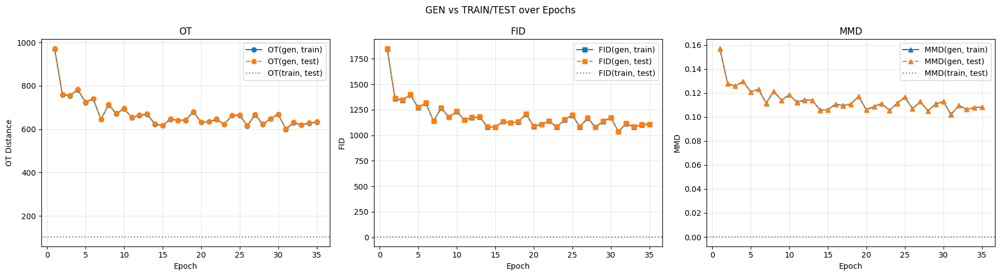

In [ ]:
test_per_epoch()

According to the graphs and results, we can conclude that the generative model demonstrates **consistent improvement over the first 15-20 epochs**, as the OT distance, FID, and MMD, between the gen and the train/test become smaller.

However, relative to the OT(train, test) reference, **a persistent gap between the generated data and both the training and test datasets remains** , indicating that additional optimization is required to further reduce the distributional difference.

### Coverage/Diversity (Recall)

Gradually add digits to TEST subset, compare to TRAIN

In [ ]:
def evaluate_coverage(blur=0.05):
    ot_results = []
    selected_digits = []

    print("Computing coverage for blur:", blur)
    for digit in range(0, 10):
        selected_digits.append(digit)
        print(f"Evaluating test = {selected_digits}")
        degraded_features = return_features_by_digits(digit_datasets_test, selected_digits)

        if digit == 9:
            ot, last_time = test_OT(degraded_features, train_features, blur, return_time=True)
        else:
            ot = test_OT(degraded_features, train_features, blur)

        print(f"    OT(Test',Train): {float(ot)}")
        ot_results.append(float(ot))

    return np.array(ot_results, dtype=float),last_time


### Fidelity/Precision

Add noise to TEST, compare to TRAIN

In [ ]:
def add_noise_to_test_dataset(noise_std):
    noise_transform = T.Compose([
        T.ToTensor(),
        lambda x: x + noise_std * torch.randn_like(x),
        lambda x: torch.clamp(x, 0, 1),
        lambda x: x * 2 - 1  # Match original transform
    ])
    noised_dataset = datasets.MNIST(root='./data', train=False, download=True, transform=noise_transform)
    noised_loader = DataLoader(noised_dataset, batch_size=BATCH_SIZE, shuffle=False)
    return get_feature_vectors(cnn_mnist, noised_loader, device)

In [ ]:
def evaluate_fidelity(seed = 42,blur=0.05):
    noise_stds=np.linspace(0.0, 1.0, 11)
    ot_results = []
    torch.manual_seed(seed)
    print("Computing fidelity for blur: ",blur)
    for std in noise_stds:
        print(f"  Adding noise with std to test={std:.2f}...")
        noised_features = add_noise_to_test_dataset(std)
        ot = test_OT(noised_features, train_features,blur)
        print(f"      OT(Test',Train): {float(ot)}")
        ot_results.append(float(ot))

    return np.array(noise_stds, dtype=float), np.array(ot_results, dtype=float)


### Overfitting

Replace TEST with TRAIN samples, compare to TRAIN and held-out TEST

In [ ]:
# Split test set into two halves
test_indices = torch.randperm(len(test_dataset))
half = len(test_dataset) // 2
test1_indices, test2_indices = test_indices[:half], test_indices[half:]
test1_dataset = Subset(test_dataset, test1_indices)   # will be mixed with train
test2_dataset = Subset(test_dataset, test2_indices)   # held-out for evaluation
test2_features = get_feature_vectors(cnn_mnist, DataLoader(test2_dataset, batch_size=BATCH_SIZE), device)

In [ ]:
def make_mixed_dataset(base_dataset, train_dataset, fraction):
    num_replace = int(len(base_dataset) * fraction)

    train_indices = torch.randperm(len(train_dataset))[:num_replace]
    train_subset = Subset(train_dataset, train_indices)

    keep_indices = torch.randperm(len(base_dataset))[:len(base_dataset) - num_replace]
    keep_subset = Subset(base_dataset, keep_indices)

    mixed_dataset = ConcatDataset([keep_subset, train_subset])
    mixed_loader = DataLoader(mixed_dataset, batch_size=BATCH_SIZE, shuffle=False)
    return get_feature_vectors(cnn_mnist, mixed_loader, device)


In [ ]:
def evaluate_overfitting(seed=42, blur=0.05):
    fractions = np.linspace(0.0, 1.0, 11)
    torch.manual_seed(seed)
    ot_mixed_train, ot_mixed_test2 = [], []
    print("Computing overfitting for blur:", blur)

    for frac in fractions:
        print(f"  Fraction train mixed in: {frac:.2f}")
        mixed_features = make_mixed_dataset(test1_dataset, train_dataset, frac)

        ot_train = test_OT(mixed_features, train_features, blur)
        print(f"      OT(mixed, train): {float(ot_train)}")
        ot_mixed_train.append(float(ot_train))

        ot_test2 = test_OT(mixed_features, test2_features, blur)
        print(f"      OT(mixed, test2): {float(ot_test2)}")
        ot_mixed_test2.append(float(ot_test2))

    return np.array(fractions, dtype=float), np.array(ot_mixed_train, dtype=float), np.array(ot_mixed_test2, dtype=float)


In [ ]:
def run_experiment_for_blur(blur,figsize=(18, 4)):
    y_cov,last_time = evaluate_coverage(blur=blur)
    x_cov = np.arange(1, 11)

    print("\n")
    x_fid, y_fid = evaluate_fidelity(blur=blur)
    print("\n")
    fracs, y_ot_mixed_train, y_ot_mixed_test2 = evaluate_overfitting(blur=blur)
    print("\n")

    fig, axes = plt.subplots(1, 3, figsize=figsize, constrained_layout=True)
    ax = axes[0]

    ax.plot(x_cov, y_cov, marker='o')  # Reverse x_cov

    ax.set_title(f'Coverage (blur={blur})')
    ax.set_xlabel('Number of digits included (1..10)')
    ax.set_ylabel("OT distance (Test′ vs Train)")
    ax.set_xticks(x_cov)
    ax.invert_xaxis()
    ax.grid(True, alpha=0.3)

    ax = axes[1]
    ax.plot(x_fid, y_fid, marker='o')
    ax.set_title(f'Fidelity (blur={blur})')
    ax.set_xlabel('Noise std')
    ax.set_ylabel('OT distance (Noised Test vs Train)')
    ax.grid(True, alpha=0.3)

    ax = axes[2]
    ax.plot(fracs, y_ot_mixed_train, marker='o', label='OT(Mixed,train)')
    ax.plot(fracs, y_ot_mixed_test2, marker='s', label='OT(Mixed,test)')
    ax.set_title(f'Overfitting (blur={blur})')
    ax.set_xlabel('Fraction of train mixed into test (0→1)')
    ax.set_ylabel('OT distance')
    ax.set_xlim(0, 1)
    ax.grid(True, alpha=0.3)
    ax.legend()

    for ax in axes:
        ax.margins(y=0.05)


    results = {
        "coverage": (x_cov, y_cov),
        "fidelity": (x_fid, y_fid),
        "overfitting": {"fractions": fracs, "to_train": y_ot_mixed_train, "to_test": y_ot_mixed_test2},
    }
    return fig, results,last_time


### Testing blur

Computing coverage for blur: 0.001
Evaluating test = [0]
    OT(Test',Train): 1142.44189453125
Evaluating test = [0, 1]
    OT(Test',Train): 820.961181640625
Evaluating test = [0, 1, 2]
    OT(Test',Train): 707.1466064453125
Evaluating test = [0, 1, 2, 3]
    OT(Test',Train): 528.0252685546875
Evaluating test = [0, 1, 2, 3, 4]
    OT(Test',Train): 410.51251220703125
Evaluating test = [0, 1, 2, 3, 4, 5]
    OT(Test',Train): 326.108642578125
Evaluating test = [0, 1, 2, 3, 4, 5, 6]
    OT(Test',Train): 256.2259521484375
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7]
    OT(Test',Train): 190.13607788085938
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7, 8]
    OT(Test',Train): 144.72991943359375
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
    OT(Test',Train): 103.34805297851562


Computing fidelity for blur:  0.001
  Adding noise with std to test=0.00...
      OT(Test',Train): 103.34806060791016
  Adding noise with std to test=0.10...
      OT(Test',Train): 109.23442077636719
  Adding noise wi

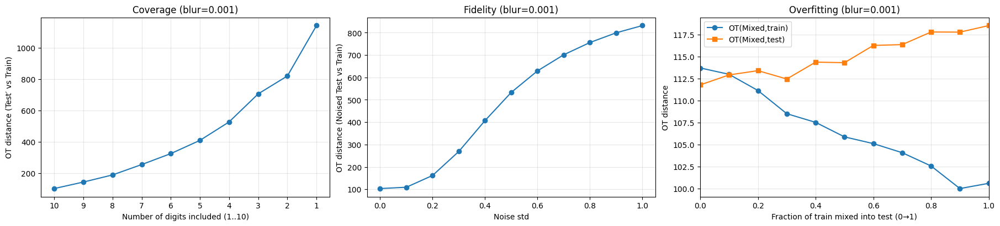

Computing coverage for blur: 0.01
Evaluating test = [0]
    OT(Test',Train): 1142.4417724609375
Evaluating test = [0, 1]
    OT(Test',Train): 820.9610595703125
Evaluating test = [0, 1, 2]
    OT(Test',Train): 707.146484375
Evaluating test = [0, 1, 2, 3]
    OT(Test',Train): 528.025146484375
Evaluating test = [0, 1, 2, 3, 4]
    OT(Test',Train): 410.512451171875
Evaluating test = [0, 1, 2, 3, 4, 5]
    OT(Test',Train): 326.1085510253906
Evaluating test = [0, 1, 2, 3, 4, 5, 6]
    OT(Test',Train): 256.22589111328125
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7]
    OT(Test',Train): 190.13604736328125
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7, 8]
    OT(Test',Train): 144.72988891601562
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
    OT(Test',Train): 103.34805297851562


Computing fidelity for blur:  0.01
  Adding noise with std to test=0.00...
      OT(Test',Train): 103.3480453491211
  Adding noise with std to test=0.10...
      OT(Test',Train): 109.23441314697266
  Adding noise with st

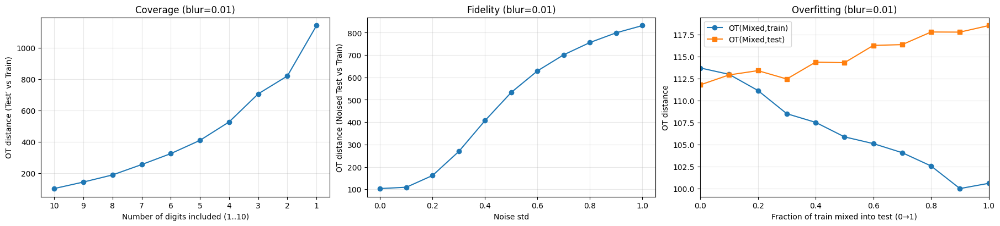

Computing coverage for blur: 0.1
Evaluating test = [0]
    OT(Test',Train): 1142.429931640625
Evaluating test = [0, 1]
    OT(Test',Train): 820.9528198242188
Evaluating test = [0, 1, 2]
    OT(Test',Train): 707.1400146484375
Evaluating test = [0, 1, 2, 3]
    OT(Test',Train): 528.02001953125
Evaluating test = [0, 1, 2, 3, 4]
    OT(Test',Train): 410.50823974609375
Evaluating test = [0, 1, 2, 3, 4, 5]
    OT(Test',Train): 326.1051330566406
Evaluating test = [0, 1, 2, 3, 4, 5, 6]
    OT(Test',Train): 256.22320556640625
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7]
    OT(Test',Train): 190.13401794433594
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7, 8]
    OT(Test',Train): 144.72828674316406
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
    OT(Test',Train): 103.3468017578125


Computing fidelity for blur:  0.1
  Adding noise with std to test=0.00...
      OT(Test',Train): 103.3468017578125
  Adding noise with std to test=0.10...
      OT(Test',Train): 109.23321533203125
  Adding noise with s

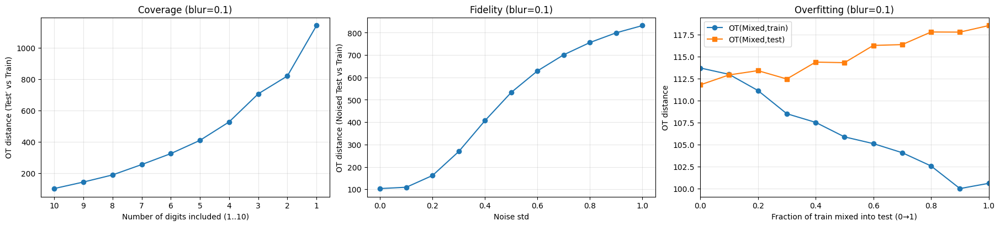

Computing coverage for blur: 1.0
Evaluating test = [0]
    OT(Test',Train): 1141.153076171875
Evaluating test = [0, 1]
    OT(Test',Train): 819.99072265625
Evaluating test = [0, 1, 2]
    OT(Test',Train): 706.3671875
Evaluating test = [0, 1, 2, 3]
    OT(Test',Train): 527.3839111328125
Evaluating test = [0, 1, 2, 3, 4]
    OT(Test',Train): 409.9622802734375
Evaluating test = [0, 1, 2, 3, 4, 5]
    OT(Test',Train): 325.63458251953125
Evaluating test = [0, 1, 2, 3, 4, 5, 6]
    OT(Test',Train): 255.82167053222656
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7]
    OT(Test',Train): 189.7935791015625
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7, 8]
    OT(Test',Train): 144.4269256591797
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
    OT(Test',Train): 103.08052062988281


Computing fidelity for blur:  1.0
  Adding noise with std to test=0.00...
      OT(Test',Train): 103.08052062988281
  Adding noise with std to test=0.10...
      OT(Test',Train): 108.95913696289062
  Adding noise with std to 

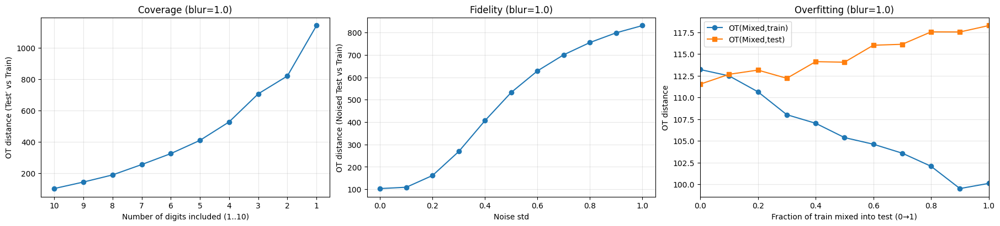

Computing coverage for blur: 10
Evaluating test = [0]
    OT(Test',Train): 932.3005981445312
Evaluating test = [0, 1]
    OT(Test',Train): 646.0504760742188
Evaluating test = [0, 1, 2]
    OT(Test',Train): 544.8544921875
Evaluating test = [0, 1, 2, 3]
    OT(Test',Train): 381.6467590332031
Evaluating test = [0, 1, 2, 3, 4]
    OT(Test',Train): 279.52093505859375
Evaluating test = [0, 1, 2, 3, 4, 5]
    OT(Test',Train): 203.70660400390625
Evaluating test = [0, 1, 2, 3, 4, 5, 6]
    OT(Test',Train): 141.9696502685547
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7]
    OT(Test',Train): 85.43341064453125
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7, 8]
    OT(Test',Train): 45.937660217285156
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
    OT(Test',Train): 12.644028663635254


Computing fidelity for blur:  10
  Adding noise with std to test=0.00...
      OT(Test',Train): 12.644030570983887
  Adding noise with std to test=0.10...
      OT(Test',Train): 23.646068572998047
  Adding noise with std

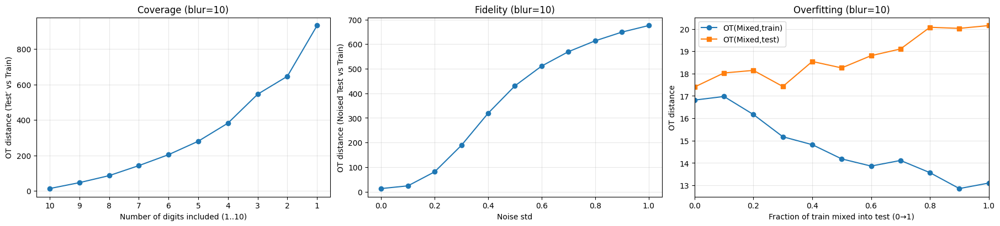

Computing coverage for blur: 100
Evaluating test = [0]
    OT(Test',Train): 542.1580810546875
Evaluating test = [0, 1]
    OT(Test',Train): 201.850830078125
Evaluating test = [0, 1, 2]
    OT(Test',Train): 160.560546875
Evaluating test = [0, 1, 2, 3]
    OT(Test',Train): 83.56942749023438
Evaluating test = [0, 1, 2, 3, 4]
    OT(Test',Train): 43.67318344116211
Evaluating test = [0, 1, 2, 3, 4, 5]
    OT(Test',Train): 18.11745262145996
Evaluating test = [0, 1, 2, 3, 4, 5, 6]
    OT(Test',Train): 18.78200912475586
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7]
    OT(Test',Train): 9.617408752441406
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7, 8]
    OT(Test',Train): 4.784946918487549
Evaluating test = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
    OT(Test',Train): 0.3390202522277832


Computing fidelity for blur:  100
  Adding noise with std to test=0.00...
      OT(Test',Train): 0.3389848470687866
  Adding noise with std to test=0.10...
      OT(Test',Train): 6.83575439453125
  Adding noise with std to t

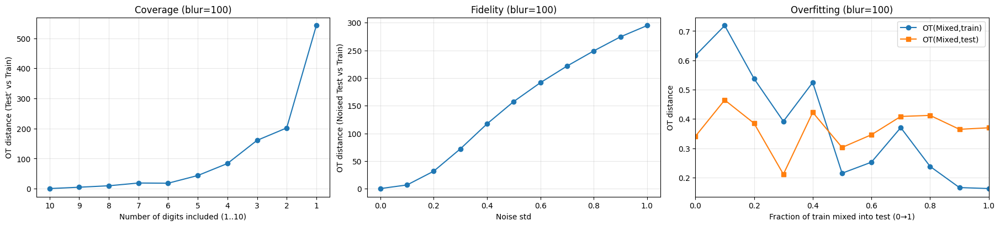

In [ ]:
blurs = [0.001, 0.01, 0.1, 1.0 ,10, 100]
times = []
for blur in blurs:
     fig, res,last_time = run_experiment_for_blur(blur)
     times.append(last_time)
     plt.show()
     fig.savefig(f"metrics_blur_{blur}.png", dpi=200); plt.close(fig)


Computing coverage for blur: 0.05
Evaluating test' = [0]
    OT(Test',Train): 1142.43896484375
Evaluating test' = [0, 1]
    OT(Test',Train): 820.958984375
Evaluating test' = [0, 1, 2]
    OT(Test',Train): 707.1448364257812
Evaluating test' = [0, 1, 2, 3]
    OT(Test',Train): 528.02392578125
Evaluating test' = [0, 1, 2, 3, 4]
    OT(Test',Train): 410.5113220214844
Evaluating test' = [0, 1, 2, 3, 4, 5]
    OT(Test',Train): 326.107666015625
Evaluating test' = [0, 1, 2, 3, 4, 5, 6]
    OT(Test',Train): 256.2251892089844
Evaluating test' = [0, 1, 2, 3, 4, 5, 6, 7]
    OT(Test',Train): 190.135498046875
Evaluating test' = [0, 1, 2, 3, 4, 5, 6, 7, 8]
    OT(Test',Train): 144.72946166992188
Evaluating test' = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
    OT(Test',Train): 103.34771728515625


Computing fidelity for blur:  0.05
  Adding noise with std to test=0.00...
      OT(Test',Train): 103.34771728515625
  Adding noise with std to test=0.10...
      OT(Test',Train): 109.23408508300781
  Adding noise wi

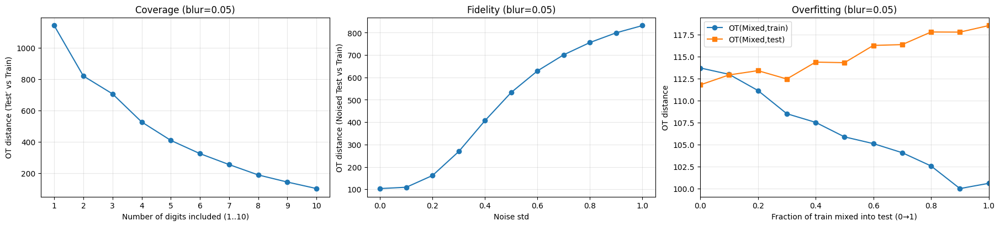

In [ ]:
blurs = [0.05]
times = []
for blur in blurs:
     fig, res,last_time = run_experiment_for_blur(blur)
     times.append(last_time)
     plt.show()
     fig.savefig(f"metrics_blur_{blur}.png", dpi=200); plt.close(fig)


*Coverage:* \
OT distance decreases as more digits are added, reflecting higher coverage of the train distribution.

*Fidelity:* \
OT distance increases with noise level, indicating reduced fidelity (less sharp alignment).

*Overfitting:*

We split the test set into two parts: `test1` and `test2`.

At each iteration, we interpolate between `test1` and the `train` set.

$
\text{OT}\!\left( (1 - \text{frac}) \cdot \text{test1} + \text{frac} \cdot \text{train}, \; \text{test2} \right)
$

- When `frac = 0`: compares **test1 vs test2**.  
- When `frac = 1`: compares **train vs test2**.  
- **increases with frac**, as the mixed set becomes less similar to test2.

$
\text{OT}\!\left( (1 - \text{frac}) \cdot \text{test1} + \text{frac} \cdot \text{train}, \; \text{train} \right)
$
- When `frac = 0`: compares **test1 vs train**.  
- When `frac = 1`: compares **train vs train**
- **decreases with frac**, as the mixed set becomes more similar to train.

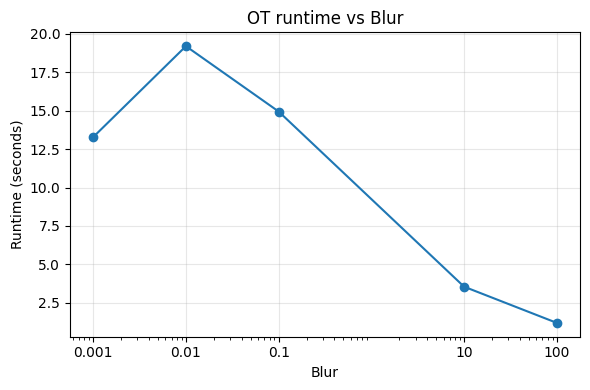

In [ ]:
plt.figure(figsize=(6, 4))
plt.plot(blurs, times, marker='o')
plt.xscale("log")
plt.xticks(blurs, [str(b) for b in blurs])

plt.title("OT runtime vs Blur")
plt.xlabel("Blur")
plt.ylabel("Runtime (seconds)")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("ot_runtime_vs_blur.png", dpi=200)
plt.show()


Test on last run of coverage (10 digits) \
Runtime decreases with larger blur, as small blur (entropy) approaches unregularized OT (higher complexity), while larger blur regularization accelerates convergence.

# Active Phase

load mnist net:


In [10]:
cnn_mnist = SimpleMNISTFeatureNet().to(device)
checkpoint_mnist = torch.load("mnist_feature_extractor.pt", map_location="cpu")
cnn_mnist.load_state_dict(checkpoint_mnist["model"])
cnn_mnist.eval()

for p in cnn_mnist.parameters():
    p.requires_grad = False

In [11]:
def _extract(arr, t, x_shape):
    out = arr.gather(-1, t.clamp(0, arr.shape[0] - 1))
    while out.dim() < len(x_shape):
        out = out.unsqueeze(-1)
    return out

In [12]:
def predict_x0_from_eps(diffusion, x_t, t, eps_pred):
    a_bar = _extract(diffusion.alphas_cumprod, t, x_t.shape)          # (B,1,1,1)
    sqrt_a_bar = torch.sqrt(torch.clamp(a_bar, min=1e-12))
    sqrt_one_minus = torch.sqrt(torch.clamp(1.0 - a_bar, min=1e-12))
    x0_hat = (x_t - sqrt_one_minus * eps_pred) / sqrt_a_bar
    return x0_hat

In [13]:
def extract_features(x, feature_net):
    with torch.no_grad():
        _, feats = feature_net(x)  # out, feat
    return feats  # (B, 128)

In [14]:
def compute_ot_loss(model, diffusion, x0, device, ot_weight=1e-3,blur=0.05):
  b = x0.size(0)
  T_full = diffusion.num_timesteps

  # Quadratic timestep sampling
  u = torch.rand(b, device=device)
  t = (u ** 2 * T_full).long().clamp(0, T_full - 1).view(-1)

  # Forward noising
  noise = torch.randn_like(x0)
  x_t = diffusion.q_sample(x_start=x0, t=t, noise=noise)

  # Noise prediction
  pred_noise = model(x_t, t)

  # Loss of noise
  loss_eps = F.mse_loss(pred_noise, noise, reduction="mean")

  # Reconstruct x0_hat
  x0_hat = predict_x0_from_eps(diffusion, x_t, t, pred_noise)

  with torch.no_grad():
      X_real = extract_features(x0, cnn_mnist)
  X_gen = extract_features(x0_hat, cnn_mnist)

  samples_loss = SamplesLoss(loss="sinkhorn", p=2,blur=blur,scaling=0.9,debias=True)

  # Uniform weights
  a = torch.full((b,), 1.0 / b, device=device)
  loss_ot = samples_loss(a, X_real, a, X_gen)

  # Compute weights dynamically
  ot_weight = loss_eps.item() / (loss_ot.item() + 1e-8) # 1e-8 in case of zero
  #balance = 1.2
  #eps_weight = balance * (loss_eps.item() / (loss_ot.item() + 1e-8))
  loss =  loss_eps + (ot_weight * loss_ot)

  return loss, {"loss_eps": loss_eps.detach(), "loss_ot": loss_ot.detach()}, ot_weight

In [15]:
def compute_val_ot_loss(model, diffusion, val_loader, device, max_batches=None):
    model.eval()
    total_loss = 0.0
    count = 0
    with torch.no_grad():
        for i, (x, _) in enumerate(val_loader):
            if max_batches is not None and i >= max_batches:
                break
            x = x.to(device)
            loss, _ ,_= compute_ot_loss(model, diffusion, x, device)
            total_loss += loss.item()
            count += 1
    return total_loss / count if count > 0 else float("nan")

In [16]:
# --- Load external comparison image ONCE ---
content_img = Image.open("epoch34_no_ot.png").convert("L")  # grayscale for MNIST
transform = T.Compose([
    T.Resize((302, 302)),  # match make_grid output with padding
    T.ToTensor()
])
content_tensor = (transform(content_img) * 255).to(torch.uint8)

In [17]:
def to_three_channels(img: torch.Tensor) -> torch.Tensor:
    """Convert grayscale (H,W) or (1,H,W) tensor to 3-channel (3,H,W)."""
    if img.ndim == 2:  # (H, W)
        img = img.unsqueeze(0)
    if img.shape[0] == 1:  # grayscale → repeat
        img = img.repeat(3, 1, 1)
    return img


In [18]:
def train_with_ot(blur=0.05,name_run=""):
  NUM_RECONS = 20
  max_batches = None
  # --- Init wandb
  wandb.init(project="ddpm-mnist-train_ot_",
    name=name_run,
    config={
    "epochs": EPOCHS,
    "batch_size": BATCH_SIZE,
    "image_size": IMAGE_SIZE
  })
  wandb.define_metric("epoch")
  wandb.define_metric("train_loss", step_metric="epoch")
  wandb.define_metric("val_loss", step_metric="epoch")

  # --- Device setup
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  print("Training on", device)

  # --- Fixed validation images, noise, and timesteps
  fixed_loader = DataLoader(val_dataset, batch_size=NUM_RECONS, shuffle=False)
  fixed_images, _ = next(iter(fixed_loader))
  fixed_images = fixed_images.to(device)

  fixed_noise = torch.randn_like(fixed_images)
  norms = fixed_noise.view(NUM_RECONS, -1).norm(dim=1)
  sorted_idx = norms.argsort()
  fixed_noise = fixed_noise[sorted_idx]
  fixed_images = fixed_images[sorted_idx]

  # --- Model & Diffusion
  model, diffusion = build_model_and_diffusion(device=device, image_size=IMAGE_SIZE)

  # --- Optimizer
  optimizer = torch.optim.Adam(model.parameters(), lr=2e-4)

  # --- Resume from checkpoint if available
  latest_ckpt = None
  for f in sorted(os.listdir(CHECKPOINT_DIR), reverse=True):
    print('f:',f)
    if f.endswith(".pt"):
        latest_ckpt = os.path.join(CHECKPOINT_DIR, f)
        break

  if latest_ckpt:
      print("Resuming from", latest_ckpt)
      ckpt = torch.load(latest_ckpt, map_location="cpu")
      model.load_state_dict(ckpt["model"])
      model.to(device)
      start_epoch = ckpt["epoch"] + 1
  #else:
      start_epoch = 1

  CHECKPOINT_DIR_OT = os.path.join(main_check_dir, name_run)
  os.makedirs(CHECKPOINT_DIR_OT, exist_ok=True)
  # --- Training loop
  for epoch in range(start_epoch, EPOCHS + 1):

        ckpt_name = f"ddpm_epoch{epoch:03d}.pt"
        ckpt_path = os.path.join(CHECKPOINT_DIR_OT, ckpt_name)

        model.train()
        pbar = tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS}")
        total_loss = 0
        total_eps = 0
        total_ot = 0
        count = 0

        for i, (x, _) in enumerate(pbar):
            if max_batches is not None and i >= max_batches:
                break
            # loss
            x0 = x.to(device)
            loss, tup_losses ,ot_weight = compute_ot_loss(model, diffusion, x0, device,blur=blur)  # OT loss now
            loss.backward()
            # optimization
            optimizer.step()
            optimizer.zero_grad()

            total_loss += loss.item()
            total_eps += tup_losses['loss_eps'].item()  # Detach is tensor, .item()
            total_ot += tup_losses['loss_ot'].item()
            count += 1
            pbar.set_postfix(loss=loss.item())

        avg_loss = total_loss / count
        avg_eps = total_eps / count
        avg_ot = total_ot / count
        wandb.log({"epoch": epoch, "train_loss": avg_loss, "train_loss_eps": avg_eps, "train_loss_ot": avg_ot, "ot_weight":ot_weight}, step=epoch)
        print(f"Epoch {epoch}: avg loss = {avg_loss:.4f}")
        torch.save({"epoch": epoch, "model": model.state_dict()}, ckpt_path)
        print("Checkpoint saved:", ckpt_path)
        # Sampling

        model.eval()
        with torch.no_grad():

            # --- Get real validation images (first 100) ---
            real_images = next(iter(val_loader))[0][:100].to(device)  # (100, C, H, W)

            # --- Sample from DDIM with 50 steps ---
            sampled_ddim_50 = diffusion.ddim_sample((100, 1, 28, 28))

            # --- Create image grids ---
            grid_real = make_grid((real_images * 255).round().to(torch.uint8), nrow=10, pad_value=255)
            grid_50 = make_grid((sampled_ddim_50 * 255).round().to(torch.uint8), nrow=10, pad_value=255)

            if epoch == EPOCHS:
                # --- Log to WandB ---
                wandb.log({
                    "real_images": wandb.Image(grid_real, caption=f"Real Validation Images (Epoch {epoch})"),
                    "samples_ddim_50": wandb.Image(grid_50, caption=f"DDIM Samples ({SAMPLING_TIMESTEPS} Steps, Epoch {epoch})"),
                }, step=epoch)
                grid_real_cpu = to_three_channels(grid_real.cpu())
                grid_50_cpu = to_three_channels(grid_50.cpu())
                content_cpu = to_three_channels(content_tensor.cpu())

                comp_tensor = torch.cat([
                      to_three_channels(grid_real_cpu),
                      to_three_channels(grid_50_cpu),
                      to_three_channels(content_cpu)
                  ], dim=2)  # concat width-wise

                  # --- Log to WandB ---
                wandb.log({
                      "comparison_last_epoch": wandb.Image(
                          comp_tensor.permute(1, 2, 0).cpu().numpy(),
                          caption="Real vs DDIM vs epoch34_no_ot"
                      )
                  }, step=epoch)

                  # --- Show inline with matplotlib ---
                fig, axes = plt.subplots(1, 3, figsize=(15, 5))
                images = [
                    (grid_real_cpu, "Real Images"),
                    (grid_50_cpu, "DDIM Samples"),
                    (content_cpu, "Epoch34_no_ot"),
                ]

                for ax, (img, title) in zip(axes, images):
                    ax.imshow(img.permute(1, 2, 0).numpy())
                    ax.set_title(title, fontsize=14)
                    ax.axis("off")

                plt.tight_layout(pad=3.0)

        # --- Validation loss ---
        torch.cuda.empty_cache()
        val_loss = compute_val_ot_loss(model, diffusion, val_loader, device)
        wandb.log({"epoch": epoch, "val_loss": val_loss}, step=epoch)
        print(f"✅ Epoch {epoch}: val loss = {val_loss:.4f}")
  return fig

In [19]:
def call_train_with_ot(blur,name_run):
  fig = train_with_ot(blur,name_run)
  gen_dir = os.path.join(main_gen_dir, name_run)
  checkpoint_dir= os.path.join(main_check_dir, name_run)
  gen_features_per_epoch(is_ot=True,range_epochs=range_epochs,gen_dir=gen_dir,checkpoint_dir=checkpoint_dir)
  test_per_epoch(blur=blur,is_ot=True,range_epochs=range_epochs,dir_name=gen_dir)
  fig.show()



In [38]:
main_gen_dir = f"{GEN_DIR}_OT"
main_check_dir = "ddpm_mnist_checkpoint_ot"
os.makedirs(main_gen_dir, exist_ok=True)
os.makedirs(main_check_dir, exist_ok=True)

# Runs Active Phase

### Fine-Tuning with Higher Weight on MSE Loss, blur=10

epoch,▁
ot_weight,▁
train_loss,▁
train_loss_eps,▁
train_loss_ot,▁
val_loss,▁
epoch,36
ot_weight,0.001
train_loss,323.0843
train_loss_eps,0.05967
train_loss_ot,323.08423


Training on cuda
f: ddpm_epoch035.pt
Resuming from ddpm_mnist_checkpoints/ddpm_epoch035.pt
resume_blur=10
ddpm_mnist_checkpoint_ot/resume_blur=10
ddpm_mnist_checkpoint_ot/resume_blur=10


Epoch 36/50: 100%|██████████| 429/429 [02:47<00:00,  2.55it/s, loss=40.2]

Epoch 36: avg loss = 416.2135
Checkpoint saved: ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch036.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 36: val loss = 148.7701


Epoch 37/50: 100%|██████████| 429/429 [02:47<00:00,  2.56it/s, loss=64.4]

Epoch 37: avg loss = 181.6016
Checkpoint saved: ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch037.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 37: val loss = 139.1344


Epoch 38/50: 100%|██████████| 429/429 [02:47<00:00,  2.56it/s, loss=57.8]

Epoch 38: avg loss = 155.9310
Checkpoint saved: ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch038.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 38: val loss = 106.1497


Epoch 39/50: 100%|██████████| 429/429 [02:47<00:00,  2.57it/s, loss=43.3]

Epoch 39: avg loss = 112.0662
Checkpoint saved: ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch039.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 39: val loss = 243.4693


Epoch 40/50: 100%|██████████| 429/429 [02:47<00:00,  2.56it/s, loss=71.5]

Epoch 40: avg loss = 122.3259
Checkpoint saved: ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch040.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 40: val loss = 102.1055


Epoch 41/50: 100%|██████████| 429/429 [02:47<00:00,  2.56it/s, loss=45.1]

Epoch 41: avg loss = 126.9762
Checkpoint saved: ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch041.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 41: val loss = 219.0714


Epoch 42/50: 100%|██████████| 429/429 [02:47<00:00,  2.57it/s, loss=53.7]

Epoch 42: avg loss = 107.1284
Checkpoint saved: ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch042.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 42: val loss = 107.7734


Epoch 43/50: 100%|██████████| 429/429 [02:47<00:00,  2.56it/s, loss=52.5]

Epoch 43: avg loss = 109.8157
Checkpoint saved: ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch043.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 43: val loss = 107.2530


Epoch 44/50: 100%|██████████| 429/429 [02:47<00:00,  2.56it/s, loss=425]

Epoch 44: avg loss = 150.9106
Checkpoint saved: ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch044.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 44: val loss = 101.9888


Epoch 45/50: 100%|██████████| 429/429 [02:47<00:00,  2.57it/s, loss=62.6]

Epoch 45: avg loss = 147.1726
Checkpoint saved: ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch045.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 45: val loss = 273.1816


Epoch 46/50: 100%|██████████| 429/429 [02:47<00:00,  2.56it/s, loss=85.1]

Epoch 46: avg loss = 151.2730
Checkpoint saved: ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch046.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 46: val loss = 252.2450


Epoch 47/50: 100%|██████████| 429/429 [02:47<00:00,  2.56it/s, loss=42.9]

Epoch 47: avg loss = 300.3145
Checkpoint saved: ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch047.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 47: val loss = 230.3101


Epoch 48/50: 100%|██████████| 429/429 [02:47<00:00,  2.56it/s, loss=43.1]

Epoch 48: avg loss = 126.2197
Checkpoint saved: ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch048.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 48: val loss = 110.7870


Epoch 49/50: 100%|██████████| 429/429 [02:47<00:00,  2.56it/s, loss=142]

Epoch 49: avg loss = 153.5291
Checkpoint saved: ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch049.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 49: val loss = 90.4210


Epoch 50/50: 100%|██████████| 429/429 [02:47<00:00,  2.56it/s, loss=55.6]

Epoch 50: avg loss = 139.9611
Checkpoint saved: ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch050.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 50: val loss = 240.7420
File mnist_gen_OT/resume_blur=10/gen_features_epoch036.pt already exists, skipping epoch 36
Loading epoch:  ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch037.pt
Generating 10000 samples for epoch:  37


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/resume_blur=10/gen_features_epoch037.pt
Saved gen_features to mnist_gen_OT/resume_blur=10/gen_features_epoch037.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch038.pt
Generating 10000 samples for epoch:  38


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/resume_blur=10/gen_features_epoch038.pt
Saved gen_features to mnist_gen_OT/resume_blur=10/gen_features_epoch038.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch039.pt
Generating 10000 samples for epoch:  39


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/resume_blur=10/gen_features_epoch039.pt
Saved gen_features to mnist_gen_OT/resume_blur=10/gen_features_epoch039.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch040.pt
Generating 10000 samples for epoch:  40


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/resume_blur=10/gen_features_epoch040.pt
Saved gen_features to mnist_gen_OT/resume_blur=10/gen_features_epoch040.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch041.pt
Generating 10000 samples for epoch:  41


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/resume_blur=10/gen_features_epoch041.pt
Saved gen_features to mnist_gen_OT/resume_blur=10/gen_features_epoch041.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch042.pt
Generating 10000 samples for epoch:  42


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/resume_blur=10/gen_features_epoch042.pt
Saved gen_features to mnist_gen_OT/resume_blur=10/gen_features_epoch042.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch043.pt
Generating 10000 samples for epoch:  43


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/resume_blur=10/gen_features_epoch043.pt
Saved gen_features to mnist_gen_OT/resume_blur=10/gen_features_epoch043.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch044.pt
Generating 10000 samples for epoch:  44


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/resume_blur=10/gen_features_epoch044.pt
Saved gen_features to mnist_gen_OT/resume_blur=10/gen_features_epoch044.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch045.pt
Generating 10000 samples for epoch:  45


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/resume_blur=10/gen_features_epoch045.pt
Saved gen_features to mnist_gen_OT/resume_blur=10/gen_features_epoch045.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch046.pt
Generating 10000 samples for epoch:  46


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/resume_blur=10/gen_features_epoch046.pt
Saved gen_features to mnist_gen_OT/resume_blur=10/gen_features_epoch046.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch047.pt
Generating 10000 samples for epoch:  47


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/resume_blur=10/gen_features_epoch047.pt
Saved gen_features to mnist_gen_OT/resume_blur=10/gen_features_epoch047.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch048.pt
Generating 10000 samples for epoch:  48


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/resume_blur=10/gen_features_epoch048.pt
Saved gen_features to mnist_gen_OT/resume_blur=10/gen_features_epoch048.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch049.pt
Generating 10000 samples for epoch:  49


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/resume_blur=10/gen_features_epoch049.pt
Saved gen_features to mnist_gen_OT/resume_blur=10/gen_features_epoch049.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/resume_blur=10/ddpm_epoch050.pt
Generating 10000 samples for epoch:  50


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/resume_blur=10/gen_features_epoch050.pt
Saved gen_features to mnist_gen_OT/resume_blur=10/gen_features_epoch050.pt
Computing OT...
Computing FID
Computing MMD
Epoch 36:
  S(gen, train) 523.5584716796875 | S(gen, test) 526.4786376953125
  FID(gen, train) 1132.1052524861823 | FID(gen, test) 1133.6759775027135
  MMD(gen, train)=0.11525022983551025, MMD(gen, test)=0.11540883779525757
Computing OT...
Computing FID
Computing MMD
Epoch 37:
  S(gen, train) 619.1013793945312 | S(gen, test) 622.4010009765625
  FID(gen, train) 1393.3244122179235 | FID(gen, test) 1394.9008384330828
  MMD(gen, train)=0.13574427366256714, MMD(gen, test)=0.13582241535186768
Computing OT...
Computing FID
Computing MMD
Epoch 38:
  S(gen, train) 614.3265991210938 | S(gen, test) 617.914306640625
  FID(gen, train) 1383.7276427945005 | FID(gen, test) 1385.959409345517
  MMD(gen, train)=0.13490283489227295, MMD(gen, test)=0.13504886627197266
Computing OT...
Computing FID
Computing MMD
Epoch 39:
  S(gen, train) 

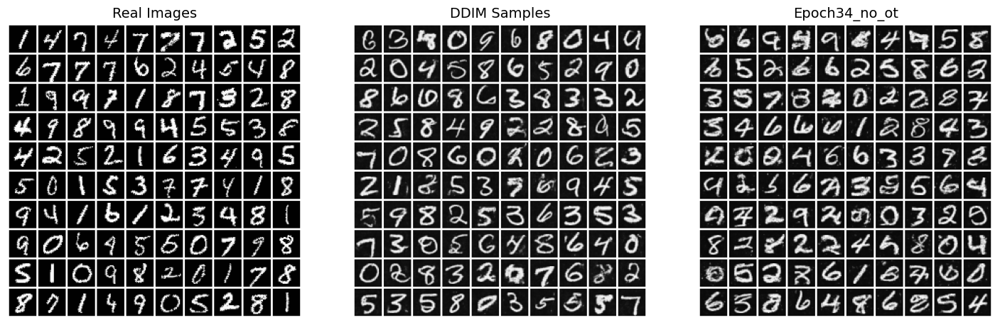

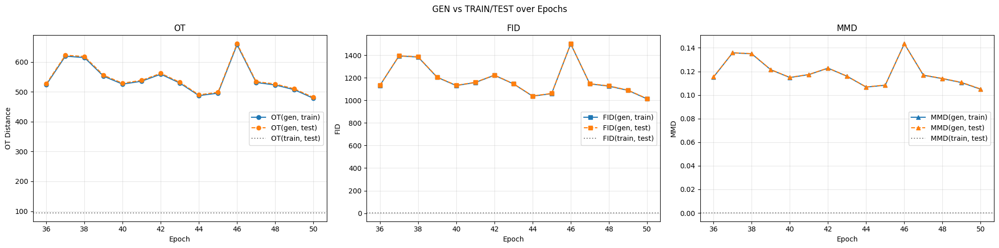

In [ ]:
blur=10
name_run = f"resume_blur={blur}"
EPOCHS=50
range_epochs=range(36,EPOCHS+1)
call_train_with_ot(blur, name_run)

### Retraining with Higher Weight on MSE Loss blur=10

epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
ot_weight,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,▃▃▁▂▂▅▁▁▂▂▂▆▁█▂▁▂█▃▃▂▂▂▁▂▂▂▁▂▄▂▂▄▁▂
train_loss_eps,▇▅▅▅▄█▄▄▃▄▃▆▃▇▃▃▄▆▂▃▂▂▂▃▂▂▃▂▁▂▂▂▂▁▁
train_loss_ot,▃▃▁▂▂▅▁▁▂▂▂▆▁█▂▁▂█▃▃▂▂▂▁▂▂▂▁▂▄▂▂▄▁▂
val_loss,▃▄▃▁▇▃█▁▁▁▂▄▄▁▃▂▂▅▄▂▃▅▁▁▃▂▂▁▁▁▂▂▂▂▁
epoch,35
ot_weight,0.001
train_loss,157.56959
train_loss_eps,0.05482
train_loss_ot,157.56953


Training on cuda
f: ddpm_epoch035.pt
Resuming from ddpm_mnist_checkpoints/ddpm_epoch035.pt


Epoch 1/35: 100%|██████████| 429/429 [02:47<00:00,  2.56it/s, loss=54.3]

Epoch 1: avg loss = 344.3138
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch001.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 1: val loss = 259.0064


Epoch 2/35: 100%|██████████| 429/429 [02:46<00:00,  2.57it/s, loss=49.8]

Epoch 2: avg loss = 129.6636
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch002.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 2: val loss = 103.7983


Epoch 3/35: 100%|██████████| 429/429 [02:46<00:00,  2.57it/s, loss=83.1]

Epoch 3: avg loss = 147.2411
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch003.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 3: val loss = 264.1782


Epoch 4/35: 100%|██████████| 429/429 [02:47<00:00,  2.56it/s, loss=1.69e+3]

Epoch 4: avg loss = 144.7879
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch004.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 4: val loss = 194.3669


Epoch 5/35: 100%|██████████| 429/429 [02:47<00:00,  2.57it/s, loss=55.6]


Epoch 5: avg loss = 135.3924
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch005.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 5: val loss = 127.8296


Epoch 6/35: 100%|██████████| 429/429 [02:46<00:00,  2.57it/s, loss=56.8]


Epoch 6: avg loss = 135.7435
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch006.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 6: val loss = 221.8910


Epoch 7/35: 100%|██████████| 429/429 [02:46<00:00,  2.57it/s, loss=56.4]

Epoch 7: avg loss = 282.1928
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch007.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 7: val loss = 177.1829


Epoch 8/35: 100%|██████████| 429/429 [02:47<00:00,  2.57it/s, loss=45]

Epoch 8: avg loss = 171.9817
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch008.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 8: val loss = 97.0051


Epoch 9/35: 100%|██████████| 429/429 [02:47<00:00,  2.57it/s, loss=65]

Epoch 9: avg loss = 210.4838
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch009.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 9: val loss = 170.8194


Epoch 10/35: 100%|██████████| 429/429 [02:47<00:00,  2.57it/s, loss=46.9]

Epoch 10: avg loss = 130.5190
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch010.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 10: val loss = 81.5609


Epoch 11/35: 100%|██████████| 429/429 [02:47<00:00,  2.57it/s, loss=47.3]


Epoch 11: avg loss = 141.4601
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch011.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 11: val loss = 105.8253


Epoch 12/35: 100%|██████████| 429/429 [02:47<00:00,  2.57it/s, loss=68.6]

Epoch 12: avg loss = 514.4048
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch012.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 12: val loss = 151.2865


Epoch 13/35: 100%|██████████| 429/429 [02:47<00:00,  2.56it/s, loss=61.7]

Epoch 13: avg loss = 152.6916
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch013.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 13: val loss = 266.6630


Epoch 14/35: 100%|██████████| 429/429 [02:46<00:00,  2.57it/s, loss=54.2]

Epoch 14: avg loss = 146.0498
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch014.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 14: val loss = 106.2179


Epoch 15/35: 100%|██████████| 429/429 [02:46<00:00,  2.57it/s, loss=36.2]

Epoch 15: avg loss = 102.9658
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch015.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 15: val loss = 188.4193


Epoch 16/35: 100%|██████████| 429/429 [02:47<00:00,  2.56it/s, loss=75.6]

Epoch 16: avg loss = 232.4531
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch016.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 16: val loss = 99.1971


Epoch 17/35: 100%|██████████| 429/429 [02:47<00:00,  2.57it/s, loss=39.8]

Epoch 17: avg loss = 146.0065
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch017.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 17: val loss = 181.4191


Epoch 18/35: 100%|██████████| 429/429 [02:46<00:00,  2.58it/s, loss=51.7]

Epoch 18: avg loss = 150.1161
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch018.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 18: val loss = 215.1988


Epoch 19/35: 100%|██████████| 429/429 [02:46<00:00,  2.58it/s, loss=55.4]

Epoch 19: avg loss = 148.4990
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch019.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 19: val loss = 89.9658


Epoch 20/35: 100%|██████████| 429/429 [02:46<00:00,  2.58it/s, loss=46.9]

Epoch 20: avg loss = 116.6949
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch020.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 20: val loss = 160.7881


Epoch 21/35: 100%|██████████| 429/429 [02:46<00:00,  2.58it/s, loss=57.3]

Epoch 21: avg loss = 197.3565
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch021.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 21: val loss = 90.6142


Epoch 22/35: 100%|██████████| 429/429 [02:46<00:00,  2.57it/s, loss=61.7]

Epoch 22: avg loss = 163.1256
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch022.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 22: val loss = 118.2033


Epoch 23/35: 100%|██████████| 429/429 [02:46<00:00,  2.58it/s, loss=47.9]

Epoch 23: avg loss = 176.6726
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch023.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 23: val loss = 189.4809


Epoch 24/35: 100%|██████████| 429/429 [02:46<00:00,  2.57it/s, loss=44.6]

Epoch 24: avg loss = 161.8717
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch024.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 24: val loss = 223.8991


Epoch 25/35: 100%|██████████| 429/429 [02:47<00:00,  2.57it/s, loss=49.8]

Epoch 25: avg loss = 112.2750
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch025.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 25: val loss = 133.9711


Epoch 26/35: 100%|██████████| 429/429 [02:46<00:00,  2.57it/s, loss=28.3]

Epoch 26: avg loss = 116.8967
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch026.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 26: val loss = 84.3997


Epoch 27/35: 100%|██████████| 429/429 [02:47<00:00,  2.56it/s, loss=80.9]

Epoch 27: avg loss = 183.8915
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch027.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 27: val loss = 115.6820


Epoch 28/35: 100%|██████████| 429/429 [02:46<00:00,  2.57it/s, loss=43.1]

Epoch 28: avg loss = 117.0080
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch028.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 28: val loss = 295.3217


Epoch 29/35: 100%|██████████| 429/429 [02:46<00:00,  2.57it/s, loss=40.7]

Epoch 29: avg loss = 154.2802
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch029.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 29: val loss = 314.9142


Epoch 30/35: 100%|██████████| 429/429 [02:46<00:00,  2.58it/s, loss=79.3]

Epoch 30: avg loss = 113.6545
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch030.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 30: val loss = 346.0334


Epoch 31/35: 100%|██████████| 429/429 [02:46<00:00,  2.58it/s, loss=66.1]


Epoch 31: avg loss = 164.7866
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch031.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 31: val loss = 135.2454


Epoch 32/35: 100%|██████████| 429/429 [02:47<00:00,  2.57it/s, loss=1.31e+3]

Epoch 32: avg loss = 142.8384
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch032.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 32: val loss = 170.0026


Epoch 33/35: 100%|██████████| 429/429 [02:46<00:00,  2.58it/s, loss=85.3]

Epoch 33: avg loss = 114.3471
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch033.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 33: val loss = 97.0244


Epoch 34/35: 100%|██████████| 429/429 [02:46<00:00,  2.58it/s, loss=44.7]

Epoch 34: avg loss = 158.4172
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch034.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 34: val loss = 84.3612


Epoch 35/35: 100%|██████████| 429/429 [02:46<00:00,  2.58it/s, loss=44.3]

Epoch 35: avg loss = 123.8356
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch035.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 35: val loss = 362.3848


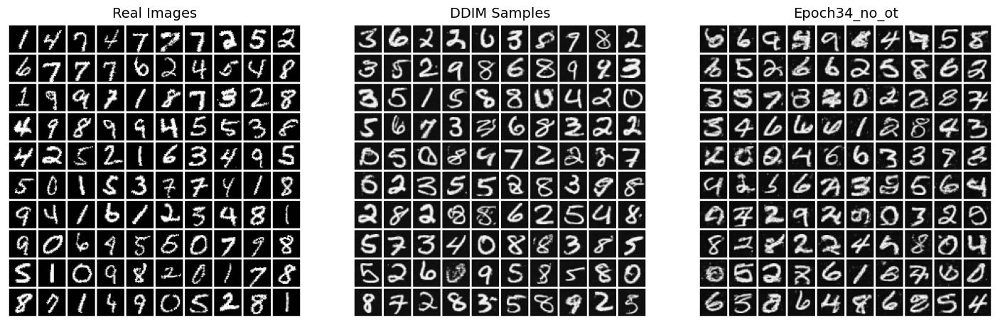

In [ ]:
blur=10
name_run = f"start_blur={blur}"
EPOCHS=35
range_epochs=range(1,EPOCHS+1)
fig = train_with_ot(blur,name_run)

In [ ]:
gen_dir = os.path.join(main_gen_dir, name_run)
checkpoint_dir= os.path.join(main_check_dir, name_run)
gen_features_per_epoch(is_ot=True,range_epochs=range_epochs,gen_dir=gen_dir,checkpoint_dir=checkpoint_dir)

File mnist_gen_OT/start_blur=10/gen_features_epoch001.pt already exists, skipping epoch 1
File mnist_gen_OT/start_blur=10/gen_features_epoch002.pt already exists, skipping epoch 2
File mnist_gen_OT/start_blur=10/gen_features_epoch003.pt already exists, skipping epoch 3
File mnist_gen_OT/start_blur=10/gen_features_epoch004.pt already exists, skipping epoch 4
File mnist_gen_OT/start_blur=10/gen_features_epoch005.pt already exists, skipping epoch 5
File mnist_gen_OT/start_blur=10/gen_features_epoch006.pt already exists, skipping epoch 6
File mnist_gen_OT/start_blur=10/gen_features_epoch007.pt already exists, skipping epoch 7
File mnist_gen_OT/start_blur=10/gen_features_epoch008.pt already exists, skipping epoch 8
File mnist_gen_OT/start_blur=10/gen_features_epoch009.pt already exists, skipping epoch 9
File mnist_gen_OT/start_blur=10/gen_features_epoch010.pt already exists, skipping epoch 10
File mnist_gen_OT/start_blur=10/gen_features_epoch011.pt already exists, skipping epoch 11
File mni

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/start_blur=10/gen_features_epoch019.pt
Saved gen_features to mnist_gen_OT/start_blur=10/gen_features_epoch019.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch020.pt
Generating 10000 samples for epoch:  20


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/start_blur=10/gen_features_epoch020.pt
Saved gen_features to mnist_gen_OT/start_blur=10/gen_features_epoch020.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch021.pt
Generating 10000 samples for epoch:  21


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/start_blur=10/gen_features_epoch021.pt
Saved gen_features to mnist_gen_OT/start_blur=10/gen_features_epoch021.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch022.pt
Generating 10000 samples for epoch:  22


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/start_blur=10/gen_features_epoch022.pt
Saved gen_features to mnist_gen_OT/start_blur=10/gen_features_epoch022.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch023.pt
Generating 10000 samples for epoch:  23


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/start_blur=10/gen_features_epoch023.pt
Saved gen_features to mnist_gen_OT/start_blur=10/gen_features_epoch023.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch024.pt
Generating 10000 samples for epoch:  24


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/start_blur=10/gen_features_epoch024.pt
Saved gen_features to mnist_gen_OT/start_blur=10/gen_features_epoch024.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch025.pt
Generating 10000 samples for epoch:  25


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/start_blur=10/gen_features_epoch025.pt
Saved gen_features to mnist_gen_OT/start_blur=10/gen_features_epoch025.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch026.pt
Generating 10000 samples for epoch:  26


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/start_blur=10/gen_features_epoch026.pt
Saved gen_features to mnist_gen_OT/start_blur=10/gen_features_epoch026.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch027.pt
Generating 10000 samples for epoch:  27


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/start_blur=10/gen_features_epoch027.pt
Saved gen_features to mnist_gen_OT/start_blur=10/gen_features_epoch027.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch028.pt
Generating 10000 samples for epoch:  28


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/start_blur=10/gen_features_epoch028.pt
Saved gen_features to mnist_gen_OT/start_blur=10/gen_features_epoch028.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch029.pt
Generating 10000 samples for epoch:  29


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/start_blur=10/gen_features_epoch029.pt
Saved gen_features to mnist_gen_OT/start_blur=10/gen_features_epoch029.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch030.pt
Generating 10000 samples for epoch:  30


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/start_blur=10/gen_features_epoch030.pt
Saved gen_features to mnist_gen_OT/start_blur=10/gen_features_epoch030.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch031.pt
Generating 10000 samples for epoch:  31


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/start_blur=10/gen_features_epoch031.pt
Saved gen_features to mnist_gen_OT/start_blur=10/gen_features_epoch031.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch032.pt
Generating 10000 samples for epoch:  32


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/start_blur=10/gen_features_epoch032.pt
Saved gen_features to mnist_gen_OT/start_blur=10/gen_features_epoch032.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch033.pt
Generating 10000 samples for epoch:  33


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/start_blur=10/gen_features_epoch033.pt
Saved gen_features to mnist_gen_OT/start_blur=10/gen_features_epoch033.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch034.pt
Generating 10000 samples for epoch:  34


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/start_blur=10/gen_features_epoch034.pt
Saved gen_features to mnist_gen_OT/start_blur=10/gen_features_epoch034.pt
Loading epoch:  ddpm_mnist_checkpoint_ot/start_blur=10/ddpm_epoch035.pt
Generating 10000 samples for epoch:  35


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

mnist_gen_OT/start_blur=10/gen_features_epoch035.pt
Saved gen_features to mnist_gen_OT/start_blur=10/gen_features_epoch035.pt


Computing OT...
Computing FID
Computing MMD
Epoch 1:
  S(gen, train) 605.7113037109375 | S(gen, test) 608.9947509765625
  FID(gen, train) 1360.3374700955715 | FID(gen, test) 1362.1243447095624
  MMD(gen, train)=0.13328158855438232, MMD(gen, test)=0.13338011503219604
Computing OT...
Computing FID
Computing MMD
Epoch 2:
  S(gen, train) 586.193603515625 | S(gen, test) 589.2415771484375
  FID(gen, train) 1299.288614899713 | FID(gen, test) 1300.6827571538124
  MMD(gen, train)=0.1287224292755127, MMD(gen, test)=0.12881481647491455
Computing OT...
Computing FID
Computing MMD
Epoch 3:
  S(gen, train) 580.4371948242188 | S(gen, test) 583.859375
  FID(gen, train) 1286.6462020517188 | FID(gen, test) 1288.7669734372782
  MMD(gen, train)=0.12753689289093018, MMD(gen, test)=0.12764960527420044
Computing OT...
Computing FID
Computing MMD
Epoch 4:
  S(gen, train) 501.5722351074219 | S(gen, test) 504.2848205566406
  FID(gen, train) 1071.8870077728325 | FID(gen, test) 1073.4027864857717
  MMD(gen, train

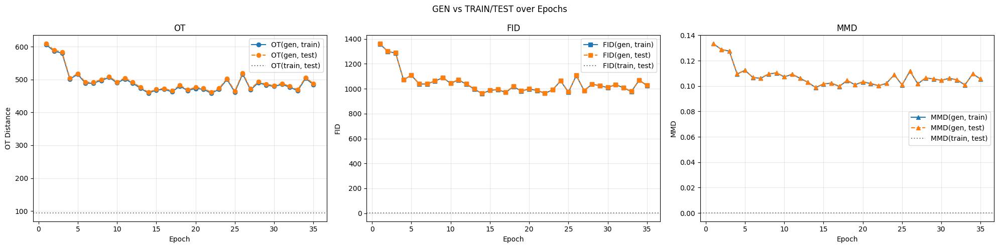

In [ ]:
test_per_epoch(blur=blur,is_ot=True,range_epochs=range_epochs,dir_name=gen_dir)
fig.show()

### Retraining with Higher Weight on MSE Loss blur=0.05

epoch,▁
ot_weight,▁
train_loss,▁
train_loss_eps,▁
train_loss_ot,▁
epoch,1
ot_weight,0.001
train_loss,372.26178
train_loss_eps,0.06033
train_loss_ot,372.26173


Training on cuda
f: ddpm_epoch035.pt
Resuming from ddpm_mnist_checkpoints/ddpm_epoch035.pt


Epoch 1/35: 100%|██████████| 429/429 [03:01<00:00,  2.37it/s, loss=82.1]

Epoch 1: avg loss = 532.9316
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch001.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 1: val loss = 260.5709


Epoch 2/35: 100%|██████████| 429/429 [03:02<00:00,  2.35it/s, loss=59.1]

Epoch 2: avg loss = 164.2029
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch002.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 2: val loss = 78.9478


Epoch 3/35: 100%|██████████| 429/429 [03:02<00:00,  2.35it/s, loss=86.2]

Epoch 3: avg loss = 205.4719
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch003.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 3: val loss = 181.5692


Epoch 4/35: 100%|██████████| 429/429 [03:02<00:00,  2.35it/s, loss=108]

Epoch 4: avg loss = 158.0935
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch004.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 4: val loss = 300.2133


Epoch 5/35: 100%|██████████| 429/429 [03:02<00:00,  2.35it/s, loss=81]

Epoch 5: avg loss = 170.3664
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch005.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 5: val loss = 140.0964


Epoch 6/35: 100%|██████████| 429/429 [03:02<00:00,  2.35it/s, loss=90.9]

Epoch 6: avg loss = 325.8294
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch006.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 6: val loss = 290.3841


Epoch 7/35: 100%|██████████| 429/429 [03:02<00:00,  2.35it/s, loss=77.4]

Epoch 7: avg loss = 144.5982
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch007.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 7: val loss = 539.4345


Epoch 8/35: 100%|██████████| 429/429 [03:02<00:00,  2.36it/s, loss=74.2]

Epoch 8: avg loss = 167.2782
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch008.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 8: val loss = 223.2103


Epoch 9/35: 100%|██████████| 429/429 [03:01<00:00,  2.36it/s, loss=67.9]

Epoch 9: avg loss = 147.8896
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch009.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 9: val loss = 269.5989


Epoch 10/35: 100%|██████████| 429/429 [03:02<00:00,  2.35it/s, loss=71.8]

Epoch 10: avg loss = 244.5041
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch010.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 10: val loss = 101.0639


Epoch 11/35: 100%|██████████| 429/429 [03:01<00:00,  2.36it/s, loss=99.9]

Epoch 11: avg loss = 144.6217
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch011.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 11: val loss = 259.4034


Epoch 12/35: 100%|██████████| 429/429 [03:02<00:00,  2.35it/s, loss=74.2]

Epoch 12: avg loss = 157.5140
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch012.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 12: val loss = 179.8587


Epoch 13/35: 100%|██████████| 429/429 [03:02<00:00,  2.35it/s, loss=63.8]

Epoch 13: avg loss = 205.9103
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch013.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 13: val loss = 310.0331


Epoch 14/35: 100%|██████████| 429/429 [03:02<00:00,  2.35it/s, loss=89.1]

Epoch 14: avg loss = 160.9273
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch014.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 14: val loss = 114.6316


Epoch 15/35: 100%|██████████| 429/429 [03:02<00:00,  2.36it/s, loss=89.3]

Epoch 15: avg loss = 140.2264
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch015.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 15: val loss = 147.7354


Epoch 16/35: 100%|██████████| 429/429 [03:01<00:00,  2.36it/s, loss=82.5]

Epoch 16: avg loss = 527.3643
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch016.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 16: val loss = 106.1080


Epoch 17/35: 100%|██████████| 429/429 [03:01<00:00,  2.36it/s, loss=92.5]

Epoch 17: avg loss = 200.9551
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch017.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 17: val loss = 125.8401


Epoch 18/35: 100%|██████████| 429/429 [03:02<00:00,  2.35it/s, loss=74.7]

Epoch 18: avg loss = 178.6909
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch018.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 18: val loss = 85.7563


Epoch 19/35: 100%|██████████| 429/429 [03:01<00:00,  2.36it/s, loss=66.9]

Epoch 19: avg loss = 183.6474
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch019.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 19: val loss = 130.9013


Epoch 20/35: 100%|██████████| 429/429 [03:02<00:00,  2.36it/s, loss=88.6]

Epoch 20: avg loss = 154.6029
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch020.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 20: val loss = 107.5919


Epoch 21/35: 100%|██████████| 429/429 [03:01<00:00,  2.36it/s, loss=61.2]

Epoch 21: avg loss = 156.3180
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch021.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 21: val loss = 172.8266


Epoch 22/35: 100%|██████████| 429/429 [03:01<00:00,  2.36it/s, loss=85.8]

Epoch 22: avg loss = 195.5824
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch022.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 22: val loss = 223.5181


Epoch 23/35: 100%|██████████| 429/429 [03:02<00:00,  2.36it/s, loss=100]

Epoch 23: avg loss = 239.1596
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch023.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 23: val loss = 135.7804


Epoch 24/35: 100%|██████████| 429/429 [03:01<00:00,  2.36it/s, loss=107]

Epoch 24: avg loss = 154.4289
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch024.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 24: val loss = 125.5600


Epoch 25/35: 100%|██████████| 429/429 [03:01<00:00,  2.36it/s, loss=84.8]

Epoch 25: avg loss = 124.5866
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch025.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 25: val loss = 83.5396


Epoch 26/35: 100%|██████████| 429/429 [03:01<00:00,  2.36it/s, loss=93.9]

Epoch 26: avg loss = 141.8879
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch026.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 26: val loss = 193.4326


Epoch 27/35: 100%|██████████| 429/429 [03:02<00:00,  2.36it/s, loss=92.3]

Epoch 27: avg loss = 145.5944
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch027.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 27: val loss = 139.4947


Epoch 28/35: 100%|██████████| 429/429 [03:01<00:00,  2.36it/s, loss=60.4]

Epoch 28: avg loss = 132.8406
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch028.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 28: val loss = 194.2386


Epoch 29/35: 100%|██████████| 429/429 [03:02<00:00,  2.35it/s, loss=74.3]

Epoch 29: avg loss = 189.9327
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch029.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 29: val loss = 223.8614


Epoch 30/35: 100%|██████████| 429/429 [03:01<00:00,  2.36it/s, loss=74.2]

Epoch 30: avg loss = 152.1639
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch030.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 30: val loss = 122.4067


Epoch 31/35: 100%|██████████| 429/429 [03:01<00:00,  2.36it/s, loss=108]

Epoch 31: avg loss = 154.4877
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch031.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 31: val loss = 284.1012


Epoch 32/35: 100%|██████████| 429/429 [03:01<00:00,  2.36it/s, loss=84.4]

Epoch 32: avg loss = 137.5889
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch032.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 32: val loss = 106.6513


Epoch 33/35: 100%|██████████| 429/429 [03:01<00:00,  2.36it/s, loss=103]

Epoch 33: avg loss = 161.2535
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch033.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 33: val loss = 123.2967


Epoch 34/35: 100%|██████████| 429/429 [03:02<00:00,  2.36it/s, loss=1.16e+3]

Epoch 34: avg loss = 170.7122
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch034.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 34: val loss = 180.8799


Epoch 35/35: 100%|██████████| 429/429 [03:01<00:00,  2.36it/s, loss=98.1]

Epoch 35: avg loss = 157.7610
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=0.05/ddpm_epoch035.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 35: val loss = 86.9858


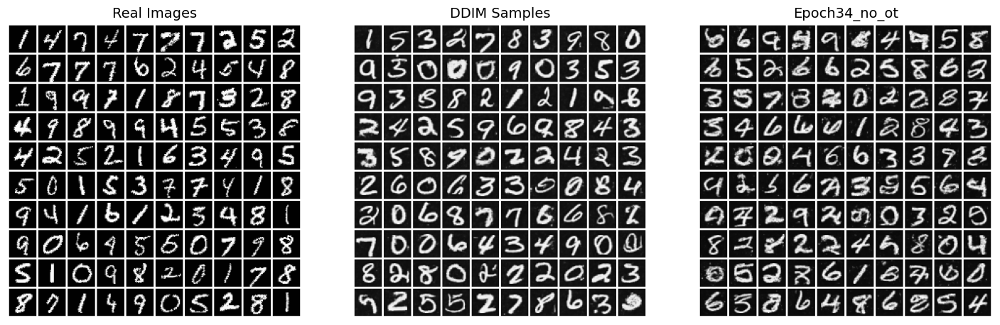

In [ ]:
blur=0.05
name_run = f"start_blur={blur}"
EPOCHS=35
range_epochs=range(1,EPOCHS+1)
fig = train_with_ot(blur,name_run)

In [ ]:
gen_dir = os.path.join(main_gen_dir, name_run)
checkpoint_dir= os.path.join(main_check_dir, name_run)
gen_features_per_epoch(is_ot=True,range_epochs=range_epochs,gen_dir=gen_dir,checkpoint_dir=checkpoint_dir)

Computing OT...
Computing FID
Computing MMD
Epoch 1:
  S(gen, train) 781.7213745117188 | S(gen, test) 782.6240234375
  FID(gen, train) 1475.8968127607816 | FID(gen, test) 1477.3179924686963
  MMD(gen, train)=0.14151662588119507, MMD(gen, test)=0.1415364146232605
Computing OT...
Computing FID
Computing MMD
Epoch 2:
  S(gen, train) 751.5687255859375 | S(gen, test) 752.8221435546875
  FID(gen, train) 1402.729902499846 | FID(gen, test) 1404.7228781335534
  MMD(gen, train)=0.13611161708831787, MMD(gen, test)=0.13620376586914062
Computing OT...
Computing FID
Computing MMD
Epoch 3:
  S(gen, train) 729.9849243164062 | S(gen, test) 731.6134033203125
  FID(gen, train) 1352.496626716505 | FID(gen, test) 1354.7464978513344
  MMD(gen, train)=0.13213711977005005, MMD(gen, test)=0.13225746154785156
Computing OT...
Computing FID
Computing MMD
Epoch 4:
  S(gen, train) 653.6995239257812 | S(gen, test) 655.0599975585938
  FID(gen, train) 1182.334348931986 | FID(gen, test) 1184.3072246286008
  MMD(gen, tr

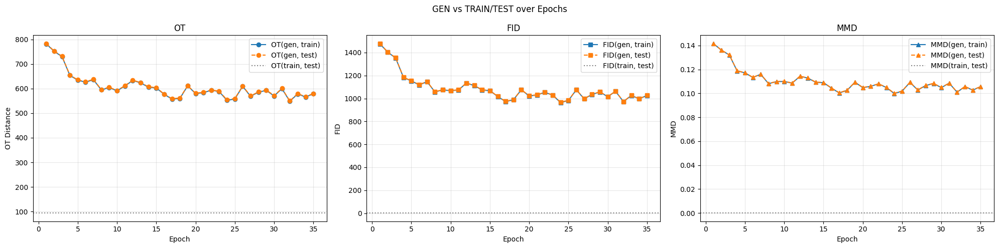

In [ ]:
test_per_epoch(blur=blur,is_ot=True,range_epochs=range_epochs,dir_name=gen_dir)
fig.show()

### Retraining with Equal Loss Weights blur=10

Training on cuda
f: ddpm_epoch035.pt
Resuming from ddpm_mnist_checkpoints/ddpm_epoch035.pt


Epoch 1/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.122]

Epoch 1: avg loss = 0.1168
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch001.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 1: val loss = 0.1136


Epoch 2/35: 100%|██████████| 429/429 [02:46<00:00,  2.58it/s, loss=0.115]

Epoch 2: avg loss = 0.1139
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch002.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 2: val loss = 0.1118


Epoch 3/35: 100%|██████████| 429/429 [02:46<00:00,  2.58it/s, loss=0.112]

Epoch 3: avg loss = 0.1143
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch003.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 3: val loss = 0.1142


Epoch 4/35: 100%|██████████| 429/429 [02:45<00:00,  2.58it/s, loss=0.104]

Epoch 4: avg loss = 0.1133
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch004.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 4: val loss = 0.1118


Epoch 5/35: 100%|██████████| 429/429 [02:46<00:00,  2.58it/s, loss=0.112]

Epoch 5: avg loss = 0.1135
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch005.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 5: val loss = 0.1151


Epoch 6/35: 100%|██████████| 429/429 [02:46<00:00,  2.58it/s, loss=0.119]

Epoch 6: avg loss = 0.1136
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch006.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 6: val loss = 0.1157


Epoch 7/35: 100%|██████████| 429/429 [02:46<00:00,  2.58it/s, loss=0.112]

Epoch 7: avg loss = 0.1129
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch007.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 7: val loss = 0.1135


Epoch 8/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.109]

Epoch 8: avg loss = 0.1123
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch008.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 8: val loss = 0.1122


Epoch 9/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.112]

Epoch 9: avg loss = 0.1125
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch009.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 9: val loss = 0.1122


Epoch 10/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.0991]

Epoch 10: avg loss = 0.1123
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch010.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 10: val loss = 0.1151


Epoch 11/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.121]

Epoch 11: avg loss = 0.1128
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch011.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 11: val loss = 0.1114


Epoch 12/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.111]

Epoch 12: avg loss = 0.1108
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch012.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 12: val loss = 0.1137


Epoch 13/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.107]

Epoch 13: avg loss = 0.1116
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch013.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 13: val loss = 0.1138


Epoch 14/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.117]

Epoch 14: avg loss = 0.1110
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch014.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 14: val loss = 0.1113


Epoch 15/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.104]

Epoch 15: avg loss = 0.1120
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch015.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 15: val loss = 0.1128


Epoch 16/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.115]

Epoch 16: avg loss = 0.1110
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch016.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 16: val loss = 0.1128


Epoch 17/35: 100%|██████████| 429/429 [02:46<00:00,  2.58it/s, loss=0.108]

Epoch 17: avg loss = 0.1112
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch017.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 17: val loss = 0.1113


Epoch 18/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.103]

Epoch 18: avg loss = 0.1110
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch018.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 18: val loss = 0.1104


Epoch 19/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.106]

Epoch 19: avg loss = 0.1113
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch019.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 19: val loss = 0.1120


Epoch 20/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.118]

Epoch 20: avg loss = 0.1111
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch020.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 20: val loss = 0.1098


Epoch 21/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.105]

Epoch 21: avg loss = 0.1105
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch021.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 21: val loss = 0.1114


Epoch 22/35: 100%|██████████| 429/429 [02:46<00:00,  2.58it/s, loss=0.112]

Epoch 22: avg loss = 0.1105
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch022.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 22: val loss = 0.1130


Epoch 23/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.118]

Epoch 23: avg loss = 0.1105
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch023.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 23: val loss = 0.1107


Epoch 24/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.114]

Epoch 24: avg loss = 0.1097
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch024.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 24: val loss = 0.1108


Epoch 25/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.106]

Epoch 25: avg loss = 0.1097
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch025.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 25: val loss = 0.1105


Epoch 26/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.123]

Epoch 26: avg loss = 0.1095
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch026.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 26: val loss = 0.1124


Epoch 27/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.11]

Epoch 27: avg loss = 0.1093
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch027.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 27: val loss = 0.1097


Epoch 28/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.111]

Epoch 28: avg loss = 0.1096
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch028.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 28: val loss = 0.1102


Epoch 29/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.107]

Epoch 29: avg loss = 0.1097
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch029.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 29: val loss = 0.1107


Epoch 30/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.117]

Epoch 30: avg loss = 0.1094
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch030.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 30: val loss = 0.1102


Epoch 31/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.104]

Epoch 31: avg loss = 0.1086
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch031.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 31: val loss = 0.1121


Epoch 32/35: 100%|██████████| 429/429 [02:45<00:00,  2.58it/s, loss=0.112]

Epoch 32: avg loss = 0.1083
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch032.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 32: val loss = 0.1119


Epoch 33/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.105]

Epoch 33: avg loss = 0.1078
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch033.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 33: val loss = 0.1104


Epoch 34/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.103]

Epoch 34: avg loss = 0.1082
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch034.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 34: val loss = 0.1105


Epoch 35/35: 100%|██████████| 429/429 [02:45<00:00,  2.59it/s, loss=0.111]

Epoch 35: avg loss = 0.1083
Checkpoint saved: ddpm_mnist_checkpoint_ot/start_blur=10_equal/ddpm_epoch035.pt


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 35: val loss = 0.1099


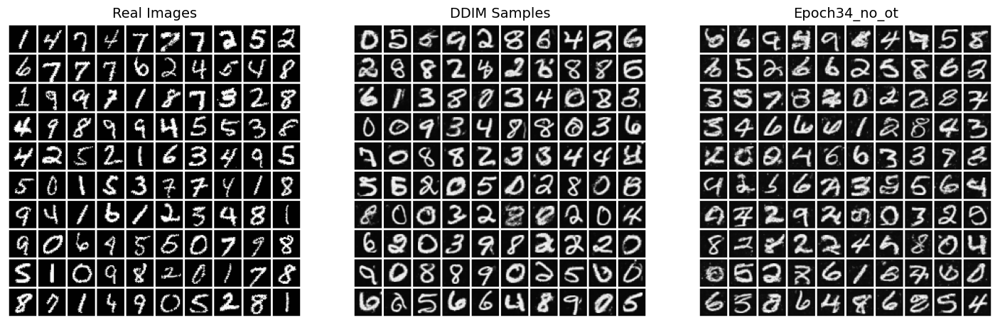

In [36]:
blur=10
name_run = f"start_blur={blur}_equal"
EPOCHS=35
range_epochs=range(1,EPOCHS+1)
fig = train_with_ot(blur,name_run)

Computing OT...
Computing FID
Computing MMD
Epoch 1:
  S(gen, train) 599.036865234375 | S(gen, test) 604.5645751953125
  FID(gen, train) 1342.4103718242527 | FID(gen, test) 1348.331789383742
  MMD(gen, train)=0.13220930099487305, MMD(gen, test)=0.1323150396347046
Computing OT...
Computing FID
Computing MMD
Epoch 2:
  S(gen, train) 569.967041015625 | S(gen, test) 575.7388305664062
  FID(gen, train) 1252.6051090187077 | FID(gen, test) 1258.6750549024227
  MMD(gen, train)=0.12498927116394043, MMD(gen, test)=0.1251259446144104
Computing OT...
Computing FID
Computing MMD
Epoch 3:
  S(gen, train) 496.88079833984375 | S(gen, test) 501.77740478515625
  FID(gen, train) 1061.7941744953027 | FID(gen, test) 1066.5492673481517
  MMD(gen, train)=0.1090167760848999, MMD(gen, test)=0.10917943716049194
Computing OT...
Computing FID
Computing MMD
Epoch 4:
  S(gen, train) 498.1722717285156 | S(gen, test) 503.1769104003906
  FID(gen, train) 1063.6887210674945 | FID(gen, test) 1069.0982363364978
  MMD(gen,

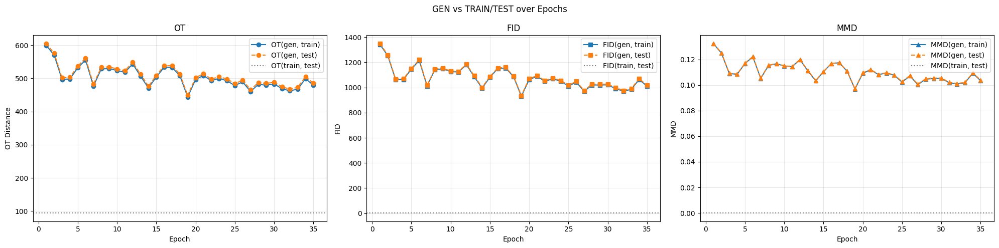

NameError: name 'fig' is not defined

In [59]:
test_per_epoch(blur=blur,is_ot=True,range_epochs=range_epochs,dir_name=gen_dir)
fig.show()